# SC1015 Mini Project
### AY2021/22 ECAD1 Group 8

## Essential Libraries
Let's import the necessary libraries.

In [1]:
import numpy as np                      # a library that offers comprehensive mathematical functions
import pandas as pd                     # a library crucial for data acquisation and preparation
import seaborn as sb                    # a library for statistical data visualisation
import matplotlib.pyplot as plt         # a library for statistical data visualisation
sb.set                                  # this is to set the default Seaborn style for graphics

<function seaborn.rcmod.set(*args, **kwargs)>

## A Glance at the Dataset

We import the dataset which is in csv format with `read_csv` from the pandas library.

In [2]:
us_accident=pd.read_csv('US_Accidents_Dec21_updated.csv')
us_accident.head()

,ID,Severity,Start_Time,End_Time,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Description,...,Roundabout,Station,Stop,Traffic_Calming,Traffic_Signal,Turning_Loop,Sunrise_Sunset,Civil_Twilight,Nautical_Twilight,Astronomical_Twilight
0,A-1,3,2016-02-08 00:37:08,2016-02-08 06:37:08,40.108910,-83.092860,40.112060,-83.031870,3.230,Between Sawmill Rd/Exit 20 and OH-315/Olentang...,...,False,False,False,False,False,False,Night,Night,Night,Night
1,A-2,2,2016-02-08 05:56:20,2016-02-08 11:56:20,39.865420,-84.062800,39.865010,-84.048730,0.747,At OH-4/OH-235/Exit 41 - Accident.,...,False,False,False,False,False,False,Night,Night,Night,Night
2,A-3,2,2016-02-08 06:15:39,2016-02-08 12:15:39,39.102660,-84.524680,39.102090,-84.523960,0.055,At I-71/US-50/Exit 1 - Accident.,...,False,False,False,False,False,False,Night,Night,Night,Day
3,A-4,2,2016-02-08 06:51:45,2016-02-08 12:51:45,41.062130,-81.537840,41.062170,-81.535470,0.123,At Dart Ave/Exit 21 - Accident.,...,False,False,False,False,False,False,Night,Night,Day,Day
4,A-5,3,2016-02-08 07:53:43,2016-02-08 13:53:43,39.172393,-84.492792,39.170476,-84.501798,0.500,At Mitchell Ave/Exit 6 - Accident.,...,False,False,False,False,False,False,Day,Day,Day,Day


Our dataset is from Kaggle: **"US Accidents (2016-2021)"** by *Sobhan Moosavi*\
Source: https://www.kaggle.com/sobhanmoosavi/us-accidents \
Description of data available at https://smoosavi.org/datasets/us_accidents.

> **ID** : This is a unique identifier of the accident record.\
> **Severity** : Shows the severity of the accident, a number between 1 and 4, where 1 indicates the least impact on traffic (i.e., short delay as a result of the accident) and 4 indicates a significant impact on traffic (i.e., long delay). \
> **Start_Time** : Shows start time of the accident in local time zone. \
> **End_Time** : Shows end time of the accident in local time zone. End time here refers to when the impact of accident on traffic flow was dismissed. \
> **Start_Lat** : Shows latitude in GPS coordinate of the start point. \
> **Start_Lng** : Shows longitude in GPS coordinate of the start point. \
> **End_Lat** : Shows latitude in GPS coordinate of the end point. \
> **End_Lng** : Shows longitude in GPS coordinate of the end point. \
> **Distance(mi)** : The length of the road extent affected by the accident. \
> **Description** : Shows natural language description of the accident. \
> **Number** : Shows the street number in address field. \
> **Street** : Shows the street name in address field. \
> **Side** : Shows the relative side of the street (Right/Left) in address field. \
> **City** : Shows the city in address field. \
> **County** : Shows the county in address field. \
> **State** : Shows the state in address field. \
> **Zipcode** : Shows the zipcode in address field. \
> **Country** : Shows the country in address field. \
> **Timezone** : Shows timezone based on the location of the accident (eastern, central, etc.). \
> **Airport_Code** : Denotes an airport-based weather station which is the closest one to location of the accident. \
> **Weather_Timestamp** : Shows the time-stamp of weather observation record (in local time). \
> **Temperature(F)** : Shows the temperature (in Fahrenheit). \
> **Wind_Chill(F)** : Shows the wind chill (in Fahrenheit). \
> **Humidity(%)** : Shows the humidity (in percentage). \
> **Pressure(in)** : Shows the air pressure (in inches). \
> **Visibility(mi)** : Shows visibility (in miles). \
> **Wind_Direction** : Shows wind direction. \
> **Wind_Speed(mph)** : Shows wind speed (in miles per hour). \
> **Precipitation(in)** : Shows precipitation amount in inches, if there is any. \
> **Weather_Condition** : Shows the weather condition (rain, snow, thunderstorm, fog, etc.) \
> **Amenity** : A POI annotation which indicates presence of amenity in a nearby location. \
> **Bump** : A POI annotation which indicates presence of speed bump or hump in a nearby location. \
> **Crossing** : A POI annotation which indicates presence of crossing in a nearby location. \
> **Give_Way** : A POI annotation which indicates presence of give_way in a nearby location. \
> **Junction** : A POI annotation which indicates presence of junction in a nearby location. \
> **No_Exit** : A POI annotation which indicates presence of no_exit in a nearby location. \
> **Railway** : A POI annotation which indicates presence of railway in a nearby location. \
> **Roundabout** : A POI annotation which indicates presence of roundabout in a nearby location. \
> **Station** : A POI annotation which indicates presence of station in a nearby location. \
> **Stop** : A POI annotation which indicates presence of stop in a nearby location. \
> **Traffic_Calming** : A POI annotation which indicates presence of traffic_calming in a nearby location. \
> **Traffic_Signal** : A POI annotation which indicates presence of traffic_signal in a nearby loction. \
> **Turning_Loop** : A POI annotation which indicates presence of turning_loop in a nearby location. \
> **Sunrise_Sunset** : Shows the period of day (i.e. day or night) based on sunrise/sunset. \
> **Civil_Twilight** : Shows the period of day (i.e. day or night) based on civil twilight. \
> **Nautical_Twilight** : Shows the period of day (i.e. day or night) based on nautical twilight. \
> **Astronomical_Twilight** : Shows the period of day (i.e. day or night) based on astronomical twilight. \

Let's have an overview of the dataset, i.e. the `type` and `shape`.

In [3]:
print("Data type:\t", type(us_accident))
print("Data dims:\t", us_accident.shape)

Data type:	 <class 'pandas.core.frame.DataFrame'>
Data dims:	 (2845342, 47)


We check the data type of each column with `info`.

In [4]:
us_accident.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2845342 entries, 0 to 2845341
Data columns (total 47 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   ID                     object 
 1   Severity               int64  
 2   Start_Time             object 
 3   End_Time               object 
 4   Start_Lat              float64
 5   Start_Lng              float64
 6   End_Lat                float64
 7   End_Lng                float64
 8   Distance(mi)           float64
 9   Description            object 
 10  Number                 float64
 11  Street                 object 
 12  Side                   object 
 13  City                   object 
 14  County                 object 
 15  State                  object 
 16  Zipcode                object 
 17  Country                object 
 18  Timezone               object 
 19  Airport_Code           object 
 20  Weather_Timestamp      object 
 21  Temperature(F)         float64
 22  Wind_Chill(F)     

## Data Preparation & Data Cleaning

We will now prepare and clean our dataset.

First up, we use `describe` to have an overview of the **count**, **mean**, **standard deviation** (denoted by std), **minimum value** (denoted by min), **first quartile** (denoted by 25%), **median** (denoted by 50%), **third quartile** (denoted by 75%) and **maximum value** (denoted by max) of the relevant columns.

In [5]:
us_accident.describe()

,Severity,Start_Lat,Start_Lng,End_Lat,End_Lng,Distance(mi),Number,Temperature(F),Wind_Chill(F),Humidity(%),Pressure(in),Visibility(mi),Wind_Speed(mph),Precipitation(in)
count,2.845342e+06,2.845342e+06,2.845342e+06,2.845342e+06,2.845342e+06,2.845342e+06,1.101431e+06,2.776068e+06,2.375699e+06,2.772250e+06,2.786142e+06,2.774796e+06,2.687398e+06,2.295884e+06
mean,2.137572e+00,3.624520e+01,-9.711463e+01,3.624532e+01,-9.711439e+01,7.026779e-01,8.089408e+03,6.179356e+01,5.965823e+01,6.436545e+01,2.947234e+01,9.099391e+00,7.395044e+00,7.016940e-03
std,4.787216e-01,5.363797e+00,1.831782e+01,5.363873e+00,1.831763e+01,1.560361e+00,1.836009e+04,1.862263e+01,2.116097e+01,2.287457e+01,1.045286e+00,2.717546e+00,5.527454e+00,9.348831e-02
min,1.000000e+00,2.456603e+01,-1.245481e+02,2.456601e+01,-1.245457e+02,0.000000e+00,0.000000e+00,-8.900000e+01,-8.900000e+01,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.000000e+00,3.344517e+01,-1.180331e+02,3.344628e+01,-1.180333e+02,5.200000e-02,1.270000e+03,5.000000e+01,4.600000e+01,4.800000e+01,2.931000e+01,1.000000e+01,3.500000e+00,0.000000e+00
50%,2.000000e+00,3.609861e+01,-9.241808e+01,3.609799e+01,-9.241772e+01,2.440000e-01,4.007000e+03,6.400000e+01,6.300000e+01,6.700000e+01,2.982000e+01,1.000000e+01,7.000000e+00,0.000000e+00
75%,2.000000e+00,4.016024e+01,-8.037243e+01,4.016105e+01,-8.037338e+01,7.640000e-01,9.567000e+03,7.600000e+01,7.600000e+01,8.300000e+01,3.001000e+01,1.000000e+01,1.000000e+01,0.000000e+00
max,4.000000e+00,4.900058e+01,-6.711317e+01,4.907500e+01,-6.710924e+01,1.551860e+02,9.999997e+06,1.960000e+02,1.960000e+02,1.000000e+02,5.890000e+01,1.400000e+02,1.087000e+03,2.400000e+01


We extract only the relevant columns which will be useful for analysis, comprised of 20 out of the 47 columns in total and have a look at the data type of each column with `info`.

In [6]:
us_acd=us_accident[["ID", "Start_Time", "Start_Lat", "Start_Lng", "Side", "State", "Temperature(F)", 
                   "Wind_Chill(F)", "Humidity(%)", "Pressure(in)", "Visibility(mi)", "Wind_Speed(mph)", 
                    "Precipitation(in)", "Weather_Condition", "Crossing", "Junction", "Traffic_Signal", 
                    "Sunrise_Sunset", "Severity", "Distance(mi)"]]
us_acd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2845342 entries, 0 to 2845341
Data columns (total 20 columns):
 #   Column             Dtype  
---  ------             -----  
 0   ID                 object 
 1   Start_Time         object 
 2   Start_Lat          float64
 3   Start_Lng          float64
 4   Side               object 
 5   State              object 
 6   Temperature(F)     float64
 7   Wind_Chill(F)      float64
 8   Humidity(%)        float64
 9   Pressure(in)       float64
 10  Visibility(mi)     float64
 11  Wind_Speed(mph)    float64
 12  Precipitation(in)  float64
 13  Weather_Condition  object 
 14  Crossing           bool   
 15  Junction           bool   
 16  Traffic_Signal     bool   
 17  Sunrise_Sunset     object 
 18  Severity           int64  
 19  Distance(mi)       float64
dtypes: bool(3), float64(10), int64(1), object(6)
memory usage: 377.2+ MB


We want to ensure all the datas are unique as we do not want duplicated data. As they are 2845342 rows and 2845342 unique IDs, this shows that our data is unique.

In [7]:
print("Total number of rows:\t\t", len(us_acd))
print("Total number of unique ID:\t", len(us_acd["ID"].unique()))

Total number of rows:		 2845342
Total number of unique ID:	 2845342


We change the name of the variables to better suit our convention.

In [8]:
us_acd.rename(columns={'Start_Time' : 'Time'}, inplace=True)
us_acd.rename(columns={'Start_Lat' : 'Latitude'}, inplace=True)
us_acd.rename(columns={'Start_Lng' : 'Longitude'}, inplace=True)
us_acd.rename(columns={'Temperature(F)' : 'Temperature'}, inplace=True)
us_acd.rename(columns={'Wind_Chill(F)' : 'Wind_Chill'}, inplace=True)
us_acd.rename(columns={'Humidity(%)' : 'Humidity'}, inplace=True)
us_acd.rename(columns={'Pressure(in)' : 'Pressure'}, inplace=True)
us_acd.rename(columns={'Visibility(mi)' : 'Visibility'}, inplace=True)
us_acd.rename(columns={'Wind_Speed(mph)' : 'Wind_Speed'}, inplace=True)
us_acd.rename(columns={'Precipitation(in)' : 'Precipitation'}, inplace=True)
us_acd.rename(columns={'Sunrise_Sunset' : 'Day_Night'}, inplace=True)
us_acd.rename(columns={'Distance(mi)' : 'Distance'}, inplace=True)

us_acd.columns=us_acd.columns.str.upper()

C:\Users\Ng Yong Jian\anaconda3\lib\site-packages\pandas\core\frame.py:5039: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


We check for NULL inputs and deal with them accordingly.

In [9]:
us_acd.isnull().sum()

ID                        0
TIME                      0
LATITUDE                  0
LONGITUDE                 0
SIDE                      0
STATE                     0
TEMPERATURE           69274
WIND_CHILL           469643
HUMIDITY              73092
PRESSURE              59200
VISIBILITY            70546
WIND_SPEED           157944
PRECIPITATION        549458
WEATHER_CONDITION     70636
CROSSING                  0
JUNCTION                  0
TRAFFIC_SIGNAL            0
DAY_NIGHT              2867
SEVERITY                  0
DISTANCE                  0
dtype: int64

We create a new dataframe in which all the selected columns contain null values and call it `nullcol`. These columns are **temperature**, **wind chill**, **humidity**, **pressure**, **visibility**, **wind speed**, **precipitation** and **weather condition**. Note that we did not include **day night** here to avoid including too much data in this dataframe, since we want to remove these data from `us_acd` later.

In [10]:
nullcol=us_acd[us_acd["TEMPERATURE"].isnull() & us_acd["WIND_CHILL"].isnull() & us_acd["HUMIDITY"].isnull()
              & us_acd["PRESSURE"].isnull() & us_acd["VISIBILITY"].isnull() & us_acd["WIND_SPEED"].isnull()
              & us_acd["PRECIPITATION"].isnull() & us_acd["WEATHER_CONDITION"].isnull()]
nullcol

,ID,TIME,LATITUDE,LONGITUDE,SIDE,STATE,TEMPERATURE,WIND_CHILL,HUMIDITY,PRESSURE,VISIBILITY,WIND_SPEED,PRECIPITATION,WEATHER_CONDITION,CROSSING,JUNCTION,TRAFFIC_SIGNAL,DAY_NIGHT,SEVERITY,DISTANCE
158,A-159,2016-02-14 17:40:17,40.036600,-85.725620,R,IN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,Day,3,0.346
160,A-161,2016-02-14 18:03:51,40.049152,-85.682047,R,IN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,Day,3,2.334
399,A-400,2016-02-23 16:00:41,41.208579,-82.807829,R,OH,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,Day,3,0.000
1102,A-1103,2016-03-25 01:49:51,37.942090,-122.475470,R,CA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,Night,2,0.008
1389,A-1390,2016-04-01 14:07:09,37.933100,-122.414470,R,CA,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,Day,2,3.344
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2845105,A-2845106,2019-08-23 12:23:00,40.703698,-111.546392,R,UT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,Day,2,0.134
2845106,A-2845107,2019-08-23 12:23:00,40.705620,-111.546730,L,UT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,True,False,False,Day,2,0.134
2845112,A-2845113,2019-08-23 13:23:00,40.792697,-111.450383,R,UT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,Day,2,0.409
2845199,A-2845200,2019-08-23 17:19:55,44.119763,-121.317222,L,OR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,False,False,False,Day,2,0.054


We want to check the data type of our `nullcol` dataframe with `info` again.

In [11]:
nullcol.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 53623 entries, 158 to 2845254
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ID                 53623 non-null  object 
 1   TIME               53623 non-null  object 
 2   LATITUDE           53623 non-null  float64
 3   LONGITUDE          53623 non-null  float64
 4   SIDE               53623 non-null  object 
 5   STATE              53623 non-null  object 
 6   TEMPERATURE        0 non-null      float64
 7   WIND_CHILL         0 non-null      float64
 8   HUMIDITY           0 non-null      float64
 9   PRESSURE           0 non-null      float64
 10  VISIBILITY         0 non-null      float64
 11  WIND_SPEED         0 non-null      float64
 12  PRECIPITATION      0 non-null      float64
 13  WEATHER_CONDITION  0 non-null      object 
 14  CROSSING           53623 non-null  bool   
 15  JUNCTION           53623 non-null  bool   
 16  TRAFFIC_SIGNAL    

We have an overview of the `nullcol` dataframe with `describe`. Similarly as before, we have the **count**, **mean**, **standard deviation** (denoted by std), **minimum value** (denoted by min), **first quartile** (denoted by 25%), **median** (denoted by 50%), **third quartile** (denoted by 75%) and **maximum value** (denoted by max) of each of the columns.

In [12]:
nullcol.describe()

,LATITUDE,LONGITUDE,TEMPERATURE,WIND_CHILL,HUMIDITY,PRESSURE,VISIBILITY,WIND_SPEED,PRECIPITATION,SEVERITY,DISTANCE
count,53623.000000,53623.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,53623.000000,53623.000000
mean,37.348994,-97.120670,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.153982,0.893766
std,3.916642,19.001672,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.501379,1.906664
min,24.623188,-124.421126,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,0.000000
25%,34.182961,-118.106456,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.000000,0.068000
50%,37.515166,-94.675310,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.000000,0.338000
75%,39.545448,-77.372835,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.000000,0.997000
max,48.908874,-67.403551,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.000000,95.262000


Since we are planning to remove the data in `nullcol` from `us_acd`, we want to compare the distribution of severity of each dataset. We find out that the distribution stays the same after the removal. 

In [13]:
us_acd["SEVERITY"].value_counts()

2    2532991
3     155105
4     131193
1      26053
Name: SEVERITY, dtype: int64

In [14]:
nullcol["SEVERITY"].value_counts()

2    47950
4     3026
3     2426
1      221
Name: SEVERITY, dtype: int64

In [15]:
us_acd_cln=us_acd.copy()

Now we create a new dataframe `us_acd_cln` which drops the rows containing all null values for **temperature**, **wind chill**, **humidity**, **pressure**, **visibility**, **wind speed** and **weather condition**.

In [16]:
us_acd_cln.drop(us_acd_cln.index[us_acd_cln["TEMPERATURE"].isnull() & us_acd_cln["WIND_CHILL"].isnull() & 
                                  us_acd_cln["HUMIDITY"].isnull() & us_acd_cln["PRESSURE"].isnull() & 
                                  us_acd_cln["VISIBILITY"].isnull() & us_acd_cln["WIND_SPEED"].isnull() & 
                                  us_acd_cln["WEATHER_CONDITION"].isnull()], inplace=True)

Now we check the data type of each columns of the cleaned data with `info` again.

In [17]:
us_acd_cln.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2790088 entries, 0 to 2845341
Data columns (total 20 columns):
 #   Column             Dtype  
---  ------             -----  
 0   ID                 object 
 1   TIME               object 
 2   LATITUDE           float64
 3   LONGITUDE          float64
 4   SIDE               object 
 5   STATE              object 
 6   TEMPERATURE        float64
 7   WIND_CHILL         float64
 8   HUMIDITY           float64
 9   PRESSURE           float64
 10  VISIBILITY         float64
 11  WIND_SPEED         float64
 12  PRECIPITATION      float64
 13  WEATHER_CONDITION  object 
 14  CROSSING           bool   
 15  JUNCTION           bool   
 16  TRAFFIC_SIGNAL     bool   
 17  DAY_NIGHT          object 
 18  SEVERITY           int64  
 19  DISTANCE           float64
dtypes: bool(3), float64(10), int64(1), object(6)
memory usage: 391.1+ MB


Here we count the number of null data from each column of the cleaned data. Notice that the value of NULL data has significantly reduced after the first round of data cleaning process. Nevertheless, there are still many NULL data in many of our variables. We will deal with them accordingly.

In [18]:
us_acd_cln.isnull().sum()

ID                        0
TIME                      0
LATITUDE                  0
LONGITUDE                 0
SIDE                      0
STATE                     0
TEMPERATURE           14020
WIND_CHILL           414389
HUMIDITY              17838
PRESSURE               3946
VISIBILITY            15292
WIND_SPEED           102690
PRECIPITATION        495835
WEATHER_CONDITION     15382
CROSSING                  0
JUNCTION                  0
TRAFFIC_SIGNAL            0
DAY_NIGHT              2291
SEVERITY                  0
DISTANCE                  0
dtype: int64

Once again, we use `describe` to have an overview of the **count**, **mean**, **standard deviation** (denoted by std), **minimum value** (denoted by min), **first quartile** (denoted by 25%), **median** (denoted by 50%), **third quartile** (denoted by 75%) and **maximum value** (denoted by max) of each of the columns of the new dataframe.

In [19]:
us_acd_cln.describe()

,LATITUDE,LONGITUDE,TEMPERATURE,WIND_CHILL,HUMIDITY,PRESSURE,VISIBILITY,WIND_SPEED,PRECIPITATION,SEVERITY,DISTANCE
count,2.790088e+06,2.790088e+06,2.776068e+06,2.375699e+06,2.772250e+06,2.786142e+06,2.774796e+06,2.687398e+06,2.294253e+06,2.790088e+06,2.790088e+06
mean,3.622521e+01,-9.711458e+01,6.179356e+01,5.965823e+01,6.436545e+01,2.947234e+01,9.099391e+00,7.395044e+00,7.021889e-03,2.137288e+00,6.990637e-01
std,5.385334e+00,1.830508e+01,1.862263e+01,2.116097e+01,2.287457e+01,1.045286e+00,2.717546e+00,5.527454e+00,9.352134e-02,4.782786e-01,1.552837e+00
min,2.456603e+01,-1.245481e+02,-8.900000e+01,-8.900000e+01,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00
25%,3.340743e+01,-1.180287e+02,5.000000e+01,4.600000e+01,4.800000e+01,2.931000e+01,1.000000e+01,3.500000e+00,0.000000e+00,2.000000e+00,5.100000e-02
50%,3.605858e+01,-9.236660e+01,6.400000e+01,6.300000e+01,6.700000e+01,2.982000e+01,1.000000e+01,7.000000e+00,0.000000e+00,2.000000e+00,2.420000e-01
75%,4.017841e+01,-8.038253e+01,7.600000e+01,7.600000e+01,8.300000e+01,3.001000e+01,1.000000e+01,1.000000e+01,0.000000e+00,2.000000e+00,7.600000e-01
max,4.900058e+01,-6.711317e+01,1.960000e+02,1.960000e+02,1.000000e+02,5.890000e+01,1.400000e+02,1.087000e+03,2.400000e+01,4.000000e+00,1.551860e+02


After a thorough examination of the distribution of our data, we have decided to drop **visibility** and **precipitation** as the data are concentrated towards a certain value. We have also decided to drop **wind chill** as the data is almost similar to that of **temperature** as we can see there are 1927118 similar values and their correlation is 0.99.

In [20]:
us_acd_cln.drop(columns=["VISIBILITY"], inplace=True)
us_acd_cln.drop(columns=["PRECIPITATION"], inplace=True)

In [21]:
us_acd_cln[(us_acd_cln["TEMPERATURE"])==(us_acd_cln["WIND_CHILL"])].shape

(1927118, 18)

In [22]:
us_acd_cln_WCT = pd.DataFrame(us_acd_cln[['TEMPERATURE', 'WIND_CHILL']])

In [23]:
print(us_acd_cln_WCT.corr())

             TEMPERATURE  WIND_CHILL
TEMPERATURE     1.000000    0.993857
WIND_CHILL      0.993857    1.000000


In [24]:
us_acd_cln.drop(columns=["WIND_CHILL"], inplace=True)

Now, we want to check the data type of our cleaned dataframe with `info` again.

In [25]:
us_acd_cln.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2790088 entries, 0 to 2845341
Data columns (total 17 columns):
 #   Column             Dtype  
---  ------             -----  
 0   ID                 object 
 1   TIME               object 
 2   LATITUDE           float64
 3   LONGITUDE          float64
 4   SIDE               object 
 5   STATE              object 
 6   TEMPERATURE        float64
 7   HUMIDITY           float64
 8   PRESSURE           float64
 9   WIND_SPEED         float64
 10  WEATHER_CONDITION  object 
 11  CROSSING           bool   
 12  JUNCTION           bool   
 13  TRAFFIC_SIGNAL     bool   
 14  DAY_NIGHT          object 
 15  SEVERITY           int64  
 16  DISTANCE           float64
dtypes: bool(3), float64(7), int64(1), object(6)
memory usage: 327.3+ MB


Next, we want to clear the null values of ```TEMPERATURE```, ```HUMIDITY```, ```PRESSURE```, ```VISIBILITY```, ```WIND_SPEED```, and ```DAY_NIGHT```. We are dealing with numerical variables first, so let us get to know more about measure of central tendency.

#### Measure of Central Tendency
#### Impute with mean, median or mode value

- **When to use mean:** If the data is symmetrically distributed, one can make use of mean for replacing missing value. One can use box plot or distribution plot to find out about the data distribution.
- **When to use median:** If the data is skewed or if the data consists of outliers, one may want to use median.
- **When to use mode:** If the data is skewed, one may want to use mode.

Once again, we use `describe` to have an overview of the **count**, **mean**, **standard deviation** (denoted by std), **minimum value** (denoted by min), **first quartile** (denoted by 25%), **median** (denoted by 50%), **third quartile** (denoted by 75%) and **maximum value** (denoted by max) of each of the columns of the cleaned dataframe.

In [26]:
us_acd_cln[["TEMPERATURE", "HUMIDITY", "PRESSURE", "WIND_SPEED"]].describe()

,TEMPERATURE,HUMIDITY,PRESSURE,WIND_SPEED
count,2.776068e+06,2.772250e+06,2.786142e+06,2.687398e+06
mean,6.179356e+01,6.436545e+01,2.947234e+01,7.395044e+00
std,1.862263e+01,2.287457e+01,1.045286e+00,5.527454e+00
min,-8.900000e+01,1.000000e+00,0.000000e+00,0.000000e+00
25%,5.000000e+01,4.800000e+01,2.931000e+01,3.500000e+00
50%,6.400000e+01,6.700000e+01,2.982000e+01,7.000000e+00
75%,7.600000e+01,8.300000e+01,3.001000e+01,1.000000e+01
max,1.960000e+02,1.000000e+02,5.890000e+01,1.087000e+03


Now we plot the boxplot for *four* variables, i.e. **temperature**, **humidity**, **pressure** and **wind speed**.

Text(0.5, 1.0, 'Wind Speed')

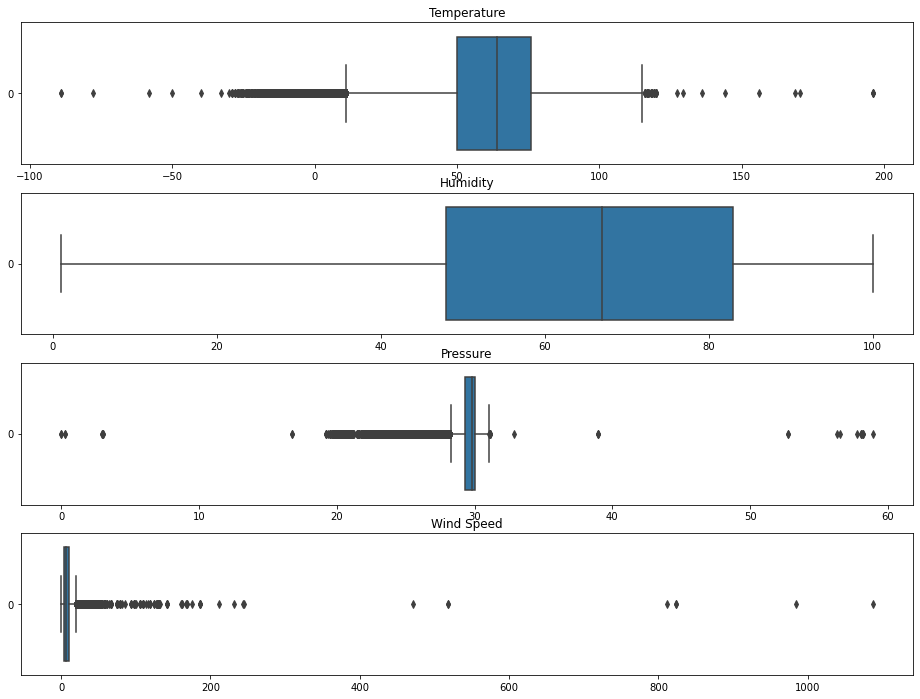

In [27]:
f, axes=plt.subplots(4, 1, figsize=(16,12))

sb.boxplot(data=us_acd_cln["TEMPERATURE"], orient='h', ax=axes[0]).set_title("Temperature")
sb.boxplot(data=us_acd_cln["HUMIDITY"], orient='h', ax=axes[1]).set_title("Humidity")
sb.boxplot(data=us_acd_cln["PRESSURE"], orient='h', ax=axes[2]).set_title("Pressure")
sb.boxplot(data=us_acd_cln["WIND_SPEED"], orient='h', ax=axes[3]).set_title("Wind Speed")

#### Skewness

Skewness is a measure of symmetry, which in turn tells us more about the distribution of the data.

- If the skewness is between **-0.5** and **0.5**, the data is fairly symmetrical.
- If the skewness is between **-1** and **- 0.5** or between **0.5** and **1**, the data is moderately skewed.
- If the skewness is less than **-1** or greater than **1**, the data is highly skewed.

From the skewness of each variable given below, we can conclude that **humidity** is fairly symmetrical, **temperature** is close to moderately skewed, whereas **pressure** and **wind speed** are highly skewed.

In [28]:
dArr=["TEMPERATURE", "HUMIDITY", "PRESSURE", "WIND_SPEED"]

for i in dArr:
    print("Skewness of ", i, "\t: ", us_acd_cln[i].skew())

Skewness of  TEMPERATURE 	:  -0.49107947108640476
Skewness of  HUMIDITY 	:  -0.41576293779119144
Skewness of  PRESSURE 	:  -3.2575401688586116
Skewness of  WIND_SPEED 	:  10.249726643017786


Here we observe the **mean**, **median** and **mode** of our data. These measures of central of tendency gives a summary of the center point of the dataset.

In [29]:
for i in dArr:
    print(i, "Mean:", us_acd_cln[i].mean(), "\tMedian:", us_acd_cln[i].median(), "\t\tMode:", us_acd_cln[i].mode())

TEMPERATURE Mean: 61.79355592154077 	Median: 64.0 		Mode: 0    73.0
dtype: float64
HUMIDITY Mean: 64.36545224997745 	Median: 67.0 		Mode: 0    93.0
dtype: float64
PRESSURE Mean: 29.47234438159215 	Median: 29.82 		Mode: 0    29.96
dtype: float64
WIND_SPEED Mean: 7.395044202615834 	Median: 7.0 		Mode: 0    0.0
dtype: float64


After considering the skewness, we decided to use **mean** to fill the null values for **temperature** and **humidity** while **median** for **pressure** and **wind speed**. As such, we can replace all the null values without changing the distribution. Futhermore, the values of mean and median are pretty much similar, with only a very small margin, that's why we chose median over mode for the highly skewed data.

In [30]:
from sklearn.impute import SimpleImputer

imputer_mean=SimpleImputer(missing_values=np.NaN, strategy='mean')
imputer_median=SimpleImputer(missing_values=np.NaN, strategy='median')
imputer_mode=SimpleImputer(missing_values=np.NaN, strategy='most_frequent')

In [31]:
us_acd_cln.TEMPERATURE=imputer_mean.fit_transform(us_acd_cln["TEMPERATURE"].values.reshape(-1,1))[:,0]
us_acd_cln.HUMIDITY=imputer_mean.fit_transform(us_acd_cln["HUMIDITY"].values.reshape(-1,1))[:,0]
us_acd_cln.PRESSURE=imputer_median.fit_transform(us_acd_cln["PRESSURE"].values.reshape(-1,1))[:,0]
us_acd_cln.WIND_SPEED=imputer_median.fit_transform(us_acd_cln["WIND_SPEED"].values.reshape(-1,1))[:,0]

Here we count the number of null data from each column of the cleaned data. Notice that we still have null values in the categorical variables **Weather Condition** and **Day / Night**

In [32]:
us_acd_cln.isnull().sum()

ID                       0
TIME                     0
LATITUDE                 0
LONGITUDE                0
SIDE                     0
STATE                    0
TEMPERATURE              0
HUMIDITY                 0
PRESSURE                 0
WIND_SPEED               0
WEATHER_CONDITION    15382
CROSSING                 0
JUNCTION                 0
TRAFFIC_SIGNAL           0
DAY_NIGHT             2291
SEVERITY                 0
DISTANCE                 0
dtype: int64

The box plot with all the numerical null data replaced with mean or median. Notice that the distribution stays the same.

Text(0.5, 1.0, 'Wind Speed')

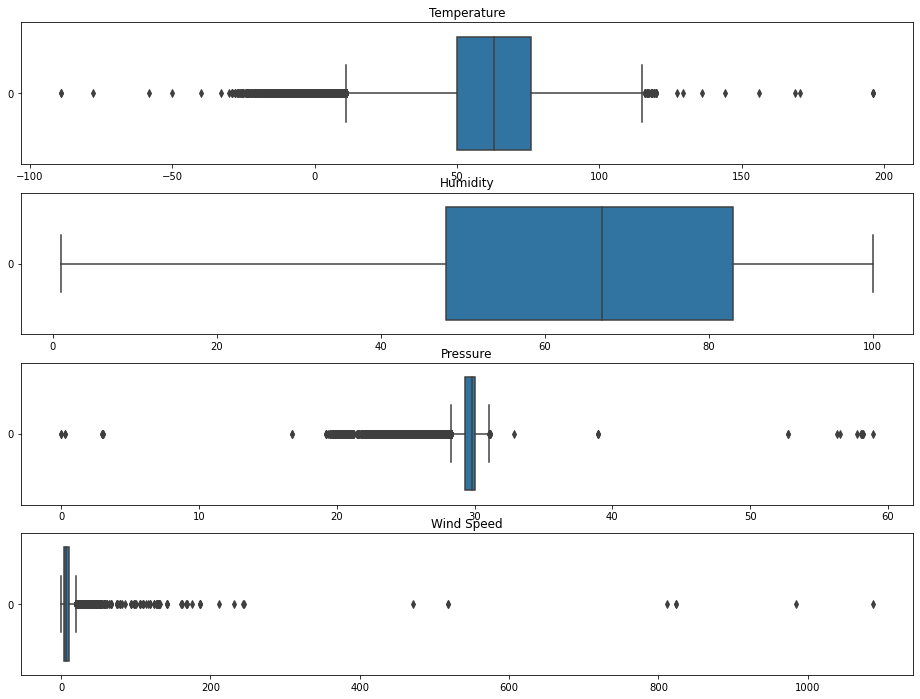

In [33]:
f, axes=plt.subplots(4, 1, figsize=(16,12))

sb.boxplot(data=us_acd_cln["TEMPERATURE"], orient='h', ax=axes[0]).set_title("Temperature")
sb.boxplot(data=us_acd_cln["HUMIDITY"], orient='h', ax=axes[1]).set_title("Humidity")
sb.boxplot(data=us_acd_cln["PRESSURE"], orient='h', ax=axes[2]).set_title("Pressure")
sb.boxplot(data=us_acd_cln["WIND_SPEED"], orient='h', ax=axes[3]).set_title("Wind Speed")

Now we deal with the null values which are non-numerical by filling **NotDefined**.

In [34]:
for col in ["DAY_NIGHT", "WEATHER_CONDITION"]:
    us_acd_cln[col].fillna(value="NotDefined", inplace=True)

Now our data does not consist of any NULL data anymore.

In [35]:
us_acd_cln.isnull().sum()

ID                   0
TIME                 0
LATITUDE             0
LONGITUDE            0
SIDE                 0
STATE                0
TEMPERATURE          0
HUMIDITY             0
PRESSURE             0
WIND_SPEED           0
WEATHER_CONDITION    0
CROSSING             0
JUNCTION             0
TRAFFIC_SIGNAL       0
DAY_NIGHT            0
SEVERITY             0
DISTANCE             0
dtype: int64

The data consists of around 3 million entries. We manipulate the data types to facilitate our exploratory data analysis and to reduce memory usage in order to achieve shorter processing time.

In [36]:
def to_category(df, *args):
    for col_name in args:
        df[col_name] = df[col_name].astype("category")
    
def to_float32(df, *args):
    for col_name in args:
        df[col_name] = df[col_name].astype("float32")
        
def to_datetime64(df, *args):
    for col_name in args:
        df[col_name] = df[col_name].astype("datetime64") 

In [37]:
to_category(us_acd_cln, ["ID", "SIDE", "STATE", "WEATHER_CONDITION", "CROSSING", "JUNCTION", "TRAFFIC_SIGNAL", 
                     "DAY_NIGHT", "SEVERITY"])
to_float32(us_acd_cln, ["LATITUDE", "LONGITUDE", "TEMPERATURE", "HUMIDITY", "PRESSURE", "WIND_SPEED", "DISTANCE"])
to_datetime64(us_acd_cln, "TIME")

This is the updated data type of all columns after the catagory for selected columns have been changed.

In [38]:
us_acd_cln.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2790088 entries, 0 to 2845341
Data columns (total 17 columns):
 #   Column             Dtype         
---  ------             -----         
 0   ID                 category      
 1   TIME               datetime64[ns]
 2   LATITUDE           float32       
 3   LONGITUDE          float32       
 4   SIDE               category      
 5   STATE              category      
 6   TEMPERATURE        float32       
 7   HUMIDITY           float32       
 8   PRESSURE           float32       
 9   WIND_SPEED         float32       
 10  WEATHER_CONDITION  category      
 11  CROSSING           category      
 12  JUNCTION           category      
 13  TRAFFIC_SIGNAL     category      
 14  DAY_NIGHT          category      
 15  SEVERITY           category      
 16  DISTANCE           float32       
dtypes: category(9), datetime64[ns](1), float32(7)
memory usage: 237.5 MB


#### States

Now we will look into the column of **STATE** and use regular expression `re.sub` to rename the abbreviated states to its full name.

In [39]:
import re

us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('AL', 'Alabama', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('AK', 'Alaska', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('AZ', 'Arizona', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('AR', 'Arkansas', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('CA', 'California', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('CO', 'Colorado', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('CT', 'Connecticut', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('DE', 'Delaware', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('DC', 'District of Columbia', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('FL', 'Florida', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('GA', 'Georgia', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('ID', 'Idaho', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('IL', 'Illinois', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('IN', 'Indiana', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('IA', 'Iowa', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('KS', 'Kansas', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('KY', 'Kentucky', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('LA', 'Louisiana', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('ME', 'Maine', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('MD', 'Maryland', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('MA', 'Massachusetts', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('MI', 'Michigan', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('MN', 'Minnesota', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('MS', 'Mississippi', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('MO', 'Missouri', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('MT', 'Montana', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('NE', 'Nebraska', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('NV', 'Nevada', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('NH', 'New Hampshire', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('NJ', 'New Jersey', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('NM', 'New Mexico', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('NY', 'New York', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('NC', 'North Carolina', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('ND', 'North Dakota', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('OH', 'Ohio', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('OK', 'Oklahoma', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('OR', 'Oregon', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('PA', 'Pennsylvania', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('RI', 'Rhode Island', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('SC', 'South Carolina', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('SD', 'South Dakota', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('TN', 'Tennessee', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('TX', 'Texas', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('UT', 'Utah', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('VT', 'Vermont', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('VA', 'Virginia', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('WA', 'Washington', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('WV', 'West Virginia', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('WI', 'Wisconsin', x))
us_acd_cln["STATE"]=us_acd_cln["STATE"].apply(lambda x: re.sub('WY', 'Wyoming', x))

Here is the list of states involved in car accidents, using `unique` function.

In [40]:
df_state=pd.DataFrame(us_acd_cln["STATE"].unique())
df_state

,0
0,Ohio
1,Indiana
2,Kentucky
3,West Virginia
4,Michigan
5,Pennsylvania
6,California
7,Nevada
8,Minnesota
9,Texas


#### Weather Conditions

We will now look into **weather conditions**. As we can see there are 128 types of weather conditions.

In [41]:
print("Number of unique WEATHER_CONDITION:\t", len(us_acd_cln["WEATHER_CONDITION"].unique()))

Number of unique WEATHER_CONDITION:	 128


We group similar weather conditions together to reduce the large number of unique categorical data under **Weather Conditions**, in order to facilitate our data analaysis.

We group them according to the following table.

| Previous | Current |
| :-----------| :---------- |
| Clear | Clear |
| Cloudy | Cloudy |
| Scattered Clouds | Cloudy |
| Cloudy / Windy | Cloudy |
| Funnel Cloud | Cloudy |
| Fair | Fair |
| Fair / Windy | Fair |
| Haze | Fog |
| Fog | Fog |
| Patches of Fog | Fog |
| Mist | Fog |
| Smoke | Fog |
| Light Freezing Fog | Fog |
| Light Fog | Fog |
| Shallow Fog | Fog |
| Sand | Fog |
| Widespread Dust | Fog |
| Blowing Dust / Windy | Fog |
| Blowing Dust | Fog |
| Fog / Windy | Fog |
| Dust Whirls | Fog |
| Haze / Windy | Fog |
| Sand / Dust Whirlwinds | Fog |
| Smoke / Windy | Fog |
| Widespread Dust / Windy | Fog |
| Partial Fog | Fog |
| Sand / Windy | Fog |
| Duststorm | Fog |
| Sand / Dust Whirlwinds / Windy | Fog |
| Blowing Sand | Fog |
| Mist / Windy | Fog |
| Patches of Fog / Windy | Fog |
| Sand / Dust Whirls Nearby | Fog |
| Light Haze | Fog |
| Volcanic Ash | Fog |
| Heavy Rain | Heavy Rain |
| Heavy Drizzle | Heavy Rain |
| Heavy Ice Pellets | Heavy Rain |
| Heavy Rain / Windy | Heavy Rain |
| Heavy Rain Shower / Windy | Heavy Rain |
| Heavy Sleet | Heavy Rain |
| Heavy Freezing Drizzle | Heavy Rain |
| Heavy Freezing Rain | Heavy Rain |
| Heavy Rain Shower | Heavy Rain |
| Heavy Rain Showers | Heavy Rain |
| Heavy Snow | Heavy Snow |
| Heavy Snow / Windy | Heavy Snow |
| Heavy Snow with Thunder | Heavy Snow |
| Light Rain | Light Rain |
| Light Freezing Drizzle | Light Rain |
| Light Drizzle | Light Rain |
| Drizzle | Light Rain |
| Light Rain Showers | Light Rain |
| Light Freezing Rain | Light Rain |
| Light Rain with Thunder | Light Rain |
| N/A Precipitation | Light Rain |
| Light Rain / Windy | Light Rain |
| Freezing Rain / Windy | Light Rain |
| Light Rain Shower | Light Rain |
| Drizzle and Fog | Light Rain |
| Light Sleet | Light Rain |
| Drizzle / Windy | Light Rain |
| Light Sleet / Windy | Light Rain |
| Light Drizzle / Windy | Light Rain |
| Light Freezing Rain / Windy | Light Rain |
| Light Rain Shower / Windy | Light Rain |
| Freezing Rain | Light Rain |
| Freezing Drizzle | Light Rain |
| Light Snow | Light Snow |
| Blowing Snow | Light Snow |
| Light Ice Pellets | Light Snow |
| Light Snow Showers | Light Snow |
| Light Snow / Windy | Light Snow |
| Light Snow and Sleet | Light Snow |
| Light Snow with Thunder | Light Snow |
| Blowing Snow / Windy | Light Snow |
| Light Snow Shower | Light Snow |
| Blowing Snow Nearby | Light Snow |
| Light Snow and Sleet / Windy | Light Snow |
| Drifting Snow | Light Snow |
| Low Drifting Snow | Light Snow |
| Light Blowing Snow | Light Snow |
| Mostly Cloudy | Mostly Cloudy |
| Mostly Cloudy / Windy | Mostly Cloudy |
| NaN | NotDefined |
| Overcast | Partly Cloudy |
| Partly Cloudy | Partly Cloudy |
| Partly Cloudy / Windy | Partly Cloudy |
| Rain | Rain |
| Rain Showers | Rain |
| Rain / Windy | Rain |
| Showers in the Vicinity | Rain |
| Rain Shower | Rain |
| Snow | Snow |
| Snow Grains | Snow |
| Ice Pellets | Snow |
| Wintry Mix | Snow |
| Small Hail | Snow |
| Wintry Mix / Windy | Snow |
| Snow / Windy | Snow |
| Snow and Sleet | Snow |
| Snow and Thunder / Windy | Snow |
| Hail | Snow |
| Sleet | Snow |
| Snow and Sleet / Windy | Snow |
| Sleet / Windy | Snow |
| Heavy Blowing Snow | Snow |
| Thunderstorms and Rain | Thunder |
| Light Thunderstorms and Rain | Thunder |
| Heavy Thunderstorms and Rain | Thunder |
| Thunderstorm | Thunder |
| Thunder | Thunder |
| Thunder in the Vicinity | Thunder |
| Heavy Thunderstorms and Snow | Thunder |
| Light Thunderstorms and Snow | Thunder |
| T-Storm | Thunder |
| Heavy T-Storm | Thunder |
| Heavy T-Storm / Windy | Thunder |
| Thunder / Windy | Thunder |
| T-Storm / Windy | Thunder |
| Thunder / Wintry Mix | Thunder |
| Thunder and Hail | Thunder |
| Thunder / Wintry Mix / Windy | Thunder |
| Heavy Thunderstorms with Small Hail | Thunder |
| Thunder and Hail / Windy | Thunder |
| Squalls | Tornado |
| Tornado | Tornado |
| Squalls / Windy | Tornado |



In [42]:
us_acd_cln['WEATHER_CONDITION'] = us_acd_cln['WEATHER_CONDITION'].replace(['Clear'], 'Clear')
us_acd_cln['WEATHER_CONDITION'] = us_acd_cln['WEATHER_CONDITION'].replace(['Cloudy', 'Scattered Clouds', 'Cloudy / Windy', 'Funnel Cloud'], 'Cloudy')
us_acd_cln['WEATHER_CONDITION'] = us_acd_cln['WEATHER_CONDITION'].replace(['Fair', 'Fair / Windy'], 'Fair')
us_acd_cln['WEATHER_CONDITION'] = us_acd_cln['WEATHER_CONDITION'].replace(['Haze', 'Fog', 'Patches of Fog', 'Mist', 'Smoke', 'Light Freezing Fog', 'Light Fog', 'Shallow Fog', 'Sand', 'Widespread Dust', 'Blowing Dust / Windy', 'Blowing Dust', 'Fog / Windy', 'Dust Whirls', 'Haze / Windy', 'Sand / Dust Whirlwinds', 'Smoke / Windy', 'Widespread Dust / Windy', 'Partial Fog', 'Sand / Windy', 'Duststorm', 'Sand / Dust Whirlwinds / Windy', 'Blowing Sand', 'Mist / Windy', 'Patches of Fog / Windy', 'Sand / Dust Whirls Nearby', 'Light Haze', 'Volcanic Ash'], 'Fog')
us_acd_cln['WEATHER_CONDITION'] = us_acd_cln['WEATHER_CONDITION'].replace(['Heavy Rain', 'Heavy Drizzle', 'Heavy Ice Pellets', 'Heavy Rain / Windy', 'Heavy Rain Shower / Windy', 'Heavy Sleet', 'Heavy Freezing Drizzle', 'Heavy Freezing Rain', 'Heavy Rain Shower', 'Heavy Rain Showers'], 'Heavy Rain')
us_acd_cln['WEATHER_CONDITION'] = us_acd_cln['WEATHER_CONDITION'].replace(['Heavy Snow', 'Heavy Snow / Windy', 'Heavy Snow with Thunder'], 'Heavy Snow')
us_acd_cln['WEATHER_CONDITION'] = us_acd_cln['WEATHER_CONDITION'].replace(['Light Rain', 'Light Freezing Drizzle', 'Light Drizzle', 'Drizzle', 'Light Rain Showers', 'Light Freezing Rain', 'Light Rain with Thunder', 'N/A Precipitation', 'Light Rain / Windy', 'Freezing Rain / Windy', 'Light Rain Shower', 'Drizzle and Fog', 'Light Sleet', 'Drizzle / Windy', 'Light Sleet / Windy', 'Light Drizzle / Windy', 'Light Freezing Rain / Windy', 'Light Rain Shower / Windy', 'Freezing Rain', 'Freezing Drizzle'], 'Light Rain')
us_acd_cln['WEATHER_CONDITION'] = us_acd_cln['WEATHER_CONDITION'].replace(['Light Snow', 'Blowing Snow', 'Light Ice Pellets', 'Light Snow Showers', 'Light Snow / Windy', 'Light Snow and Sleet', 'Light Snow with Thunder', 'Blowing Snow / Windy', 'Light Snow Shower', 'Blowing Snow Nearby', 'Light Snow and Sleet / Windy', 'Drifting Snow', 'Low Drifting Snow'], 'Light Snow')
us_acd_cln['WEATHER_CONDITION'] = us_acd_cln['WEATHER_CONDITION'].replace(['Light Blowing Snow', 'Mostly Cloudy', 'Mostly Cloudy / Windy'], 'Mostly Cloudy')
us_acd_cln['WEATHER_CONDITION'] = us_acd_cln['WEATHER_CONDITION'].replace(['Overcast', 'Partly Cloudy', 'Partly Cloudy / Windy'], 'Partly Cloudy')
us_acd_cln['WEATHER_CONDITION'] = us_acd_cln['WEATHER_CONDITION'].replace(['Rain', 'Rain Showers', 'Rain / Windy', 'Showers in the Vicinity', 'Rain Shower'], 'Rain')
us_acd_cln['WEATHER_CONDITION'] = us_acd_cln['WEATHER_CONDITION'].replace(['Snow', 'Snow Grains', 'Ice Pellets', 'Wintry Mix', 'Small Hail', 'Wintry Mix / Windy', 'Snow / Windy', 'Snow and Sleet', 'Snow and Thunder / Windy', 'Hail', 'Sleet', 'Snow and Sleet / Windy', 'Sleet / Windy', 'Heavy Blowing Snow'], 'Snow')
us_acd_cln['WEATHER_CONDITION'] = us_acd_cln['WEATHER_CONDITION'].replace(['Thunderstorms and Rain', 'Light Thunderstorms and Rain', 'Heavy Thunderstorms and Rain', 'Thunderstorm', 'Thunder', 'Thunder in the Vicinity', 'Heavy Thunderstorms and Snow', 'Light Thunderstorms and Snow', 'T-Storm', 'Heavy T-Storm', 'Heavy T-Storm / Windy', 'Thunder / Windy', 'T-Storm / Windy', 'Thunder / Wintry Mix', 'Thunder and Hail', 'Thunder / Wintry Mix / Windy', 'Heavy Thunderstorms with Small Hail', 'Thunder and Hail / Windy'], 'Thunder')
us_acd_cln['WEATHER_CONDITION'] = us_acd_cln['WEATHER_CONDITION'].replace(['Squalls', 'Tornado', 'Squalls / Windy'], 'Tornado')


After regrouping the weather conditions based on their similarities, we have 15 unique values. The number of data for each unique weather condition is shown below.

In [43]:
print("Number of unique WEATHER_CONDITION:\t", len(us_acd_cln["WEATHER_CONDITION"].unique()))
us_acd_cln["WEATHER_CONDITION"].value_counts()

Number of unique WEATHER_CONDITION:	 15


Fair             1122389
Cloudy            400740
Mostly Cloudy     370258
Partly Cloudy     338697
Clear             173823
Light Rain        148789
Fog                89474
Light Snow         46333
Rain               32854
Thunder            27083
NotDefined         15382
Heavy Rain         12712
Snow                9859
Heavy Snow          1654
Tornado               41
Name: WEATHER_CONDITION, dtype: int64

#### Distance

The conventional measurement of distance in the United States is in miles. However, here in Singapore, metres is more commonly used. On top of that, metres is the SI Unit (International System of Units) for distance measurement.

Here, we convert the distance from miles to metres to suit our convention of analysis.

In [44]:
us_acd_cln["DISTANCE"]=us_acd_cln["DISTANCE"].apply(lambda x : x*1609.34)
us_acd_cln

,ID,TIME,LATITUDE,LONGITUDE,SIDE,STATE,TEMPERATURE,HUMIDITY,PRESSURE,WIND_SPEED,WEATHER_CONDITION,CROSSING,JUNCTION,TRAFFIC_SIGNAL,DAY_NIGHT,SEVERITY,DISTANCE
0,A-1,2016-02-08 00:37:08,40.108910,-83.092857,R,Ohio,42.099998,58.0,29.760000,10.4,Light Rain,False,False,False,Night,3,5198.168231
1,A-2,2016-02-08 05:56:20,39.865421,-84.062798,R,Ohio,36.900002,91.0,29.680000,7.0,Light Rain,False,False,False,Night,2,1202.176946
2,A-3,2016-02-08 06:15:39,39.102661,-84.524681,R,Ohio,36.000000,97.0,29.700001,7.0,Partly Cloudy,False,True,False,Night,2,88.513700
3,A-4,2016-02-08 06:51:45,41.062130,-81.537842,R,Ohio,39.000000,55.0,29.650000,7.0,Partly Cloudy,False,False,False,Night,2,197.948825
4,A-5,2016-02-08 07:53:43,39.172394,-84.492790,R,Ohio,37.000000,93.0,29.690001,10.4,Light Rain,False,False,False,Day,3,804.670000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2845337,A-2845338,2019-08-23 18:03:25,34.002480,-117.379356,R,California,86.000000,40.0,28.920000,13.0,Fair,False,False,False,Day,2,873.871592
2845338,A-2845339,2019-08-23 19:11:30,32.766960,-117.148064,R,California,70.000000,73.0,29.389999,6.0,Fair,False,False,False,Day,2,543.956919
2845339,A-2845340,2019-08-23 19:00:21,33.775452,-117.847794,R,California,73.000000,64.0,29.740000,10.0,Partly Cloudy,False,True,False,Day,2,902.839723
2845340,A-2845341,2019-08-23 19:00:21,33.992458,-118.403023,R,California,71.000000,81.0,29.620001,8.0,Fair,False,False,False,Day,2,1242.410504


In [45]:
us_acd_cln.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2790088 entries, 0 to 2845341
Data columns (total 17 columns):
 #   Column             Dtype         
---  ------             -----         
 0   ID                 category      
 1   TIME               datetime64[ns]
 2   LATITUDE           float32       
 3   LONGITUDE          float32       
 4   SIDE               category      
 5   STATE              category      
 6   TEMPERATURE        float32       
 7   HUMIDITY           float32       
 8   PRESSURE           float32       
 9   WIND_SPEED         float32       
 10  WEATHER_CONDITION  category      
 11  CROSSING           category      
 12  JUNCTION           category      
 13  TRAFFIC_SIGNAL     category      
 14  DAY_NIGHT          category      
 15  SEVERITY           category      
 16  DISTANCE           float64       
dtypes: category(9), datetime64[ns](1), float32(6), float64(1)
memory usage: 245.4 MB


In [46]:
us_acd_cln.isnull().sum()

ID                   0
TIME                 0
LATITUDE             0
LONGITUDE            0
SIDE                 0
STATE                0
TEMPERATURE          0
HUMIDITY             0
PRESSURE             0
WIND_SPEED           0
WEATHER_CONDITION    0
CROSSING             0
JUNCTION             0
TRAFFIC_SIGNAL       0
DAY_NIGHT            0
SEVERITY             0
DISTANCE             0
dtype: int64

## Exploratory Data Analysis & Visualization (prelude)

We are now ready to work on our Exploratory Data Analysis and Visualization. However, this is just a preliminary stage as more data cleaning is required. More outliers will be removed in this section for a better visualization of our data.

We will be analysing data from the year 2016. Here we extract data from 2016.

The complete exploratory data analysis and visualization can be found at the later part (**Exploratory Data Analysis & Visualization**)

In [47]:
us_acd_16=us_acd_cln[us_acd_cln["TIME"].dt.year==2016]

In [48]:
us_acd_16.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 120209 entries, 0 to 161276
Data columns (total 17 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   ID                 120209 non-null  category      
 1   TIME               120209 non-null  datetime64[ns]
 2   LATITUDE           120209 non-null  float32       
 3   LONGITUDE          120209 non-null  float32       
 4   SIDE               120209 non-null  category      
 5   STATE              120209 non-null  category      
 6   TEMPERATURE        120209 non-null  float32       
 7   HUMIDITY           120209 non-null  float32       
 8   PRESSURE           120209 non-null  float32       
 9   WIND_SPEED         120209 non-null  float32       
 10  WEATHER_CONDITION  120209 non-null  category      
 11  CROSSING           120209 non-null  category      
 12  JUNCTION           120209 non-null  category      
 13  TRAFFIC_SIGNAL     120209 non-null  category

### Uni-Variate Statistics

We have two response variables, namely ```DISTANCE``` , ```SEVERITY```

We will first have a look at **distance**.

#### Distance

In [49]:
distance=pd.DataFrame(us_acd_16["DISTANCE"])
distance

,DISTANCE
0,5198.168231
1,1202.176946
2,88.513700
3,197.948825
4,804.670000
...,...
137506,98.169741
150136,98.169741
150281,98.169741
158327,98.169741


This is the boxplot for **distance**.

Text(0.5, 1.0, 'Distance')

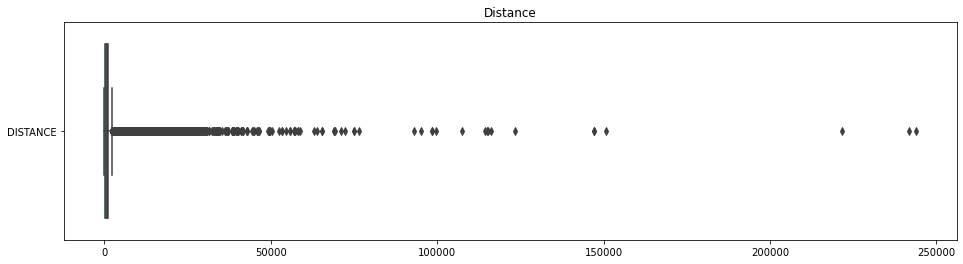

In [50]:
f=plt.figure(figsize=(16,4))
sb.boxplot(data=distance, orient='h').set_title("Distance")

This is the histogram (with kernal density estimate) for **distance**. 

Text(0.5, 1.0, 'Distance')

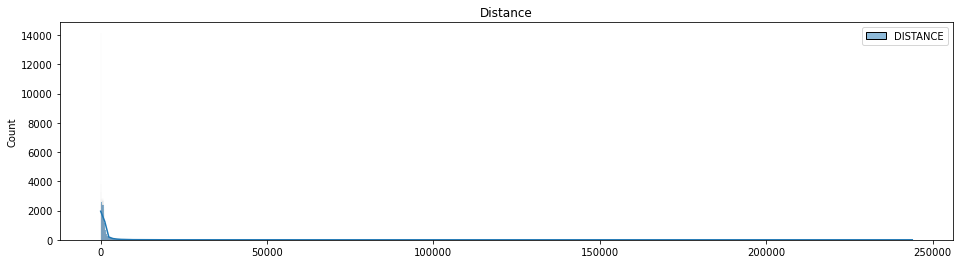

In [51]:
f=plt.figure(figsize=(16,4))
sb.histplot(data=distance, kde=True).set_title("Distance")

This is the violin plot for **distance**, this gives us a slightly better visualization on the distribution of data. Here, the data is positively skewed, with a large number of outliers.

Text(0.5, 1.0, 'Distance')

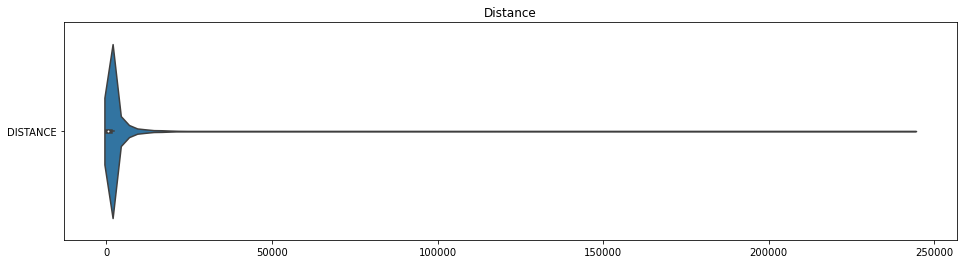

In [52]:
f=plt.figure(figsize=(16,4))
sb.violinplot(data=distance, orient='h').set_title("Distance")

The distribution here looks very bad and we could not deduce a lot of info here. Let's remove some of the extreme datas by referring to the boxplot above.

We want to have a look at the range of the outliers.

In [53]:
distance[distance["DISTANCE"]>30000].count()

DISTANCE    130
dtype: int64

In [54]:
distance[distance["DISTANCE"]>15000].count()

DISTANCE    747
dtype: int64

In [55]:
distance[distance["DISTANCE"]>5000].count()

DISTANCE    4658
dtype: int64

We decide to remove ```DISTANCE``` larger than 5000 m.

The categorical plot below shows the **Severity** level which the outliers above (distance > 5000m) fall in.

In [56]:
dl5=us_acd_16[us_acd_16["DISTANCE"]>5000]

Text(0.5, 1.0, 'Severity')

<Figure size 864x576 with 0 Axes>

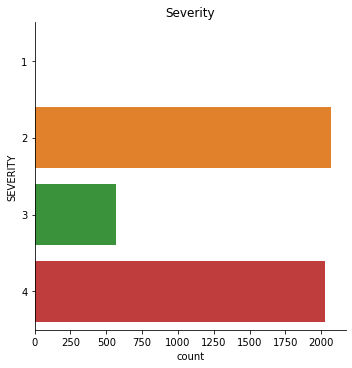

In [57]:
f=plt.figure(figsize=(12,8))
sb.catplot(y="SEVERITY", data=dl5, kind="count") #this is the outlier data
plt.title("Severity")

In [58]:
us_acd_16["SEVERITY"].value_counts() # this is the distribution of original data

2    85545
3    21118
4    13546
1        0
Name: SEVERITY, dtype: int64

In [59]:
dl5["SEVERITY"].value_counts() # this is the distribution of outlier data

2    2066
4    2025
3     567
1       0
Name: SEVERITY, dtype: int64

We notice that the ranking will stay the same after the removal *(2 3 4 1 from most to least)*. As such, we drop all the distance>5000 data and take a look at the new distribution.

In [60]:
distance.drop(distance.index[distance["DISTANCE"]>5000], inplace=True)
distance.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 115551 entries, 1 to 161276
Data columns (total 1 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   DISTANCE  115551 non-null  float64
dtypes: float64(1)
memory usage: 1.8 MB


This is the new boxplot for **distance**. As we can see, the data visualization is much more well distributed as compared to before, despite the distribution of data still being positively skewed.

Text(0.5, 1.0, 'Distance')

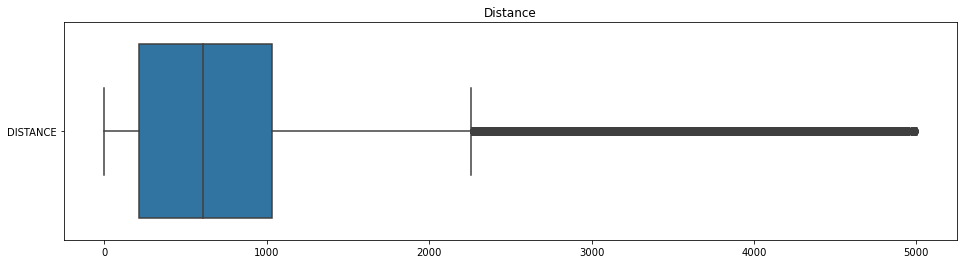

In [61]:
f=plt.figure(figsize=(16,4))
sb.boxplot(data=distance, orient='h').set_title("Distance")

This is the histogram for **distance**. The shape profile of the histogram is also much clearer after we removed some of the extreme data.

Text(0.5, 1.0, 'Distance')

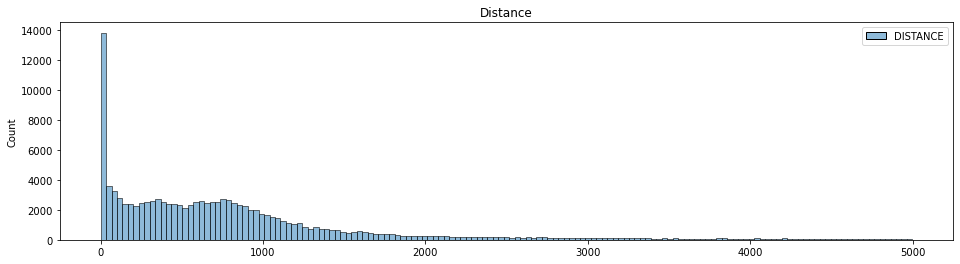

In [62]:
f=plt.figure(figsize=(16,4))
sb.histplot(data=distance).set_title("Distance")

This is the violin plot for **distance**. Now the probability density of the data is more evident here.

Text(0.5, 1.0, 'Distance')

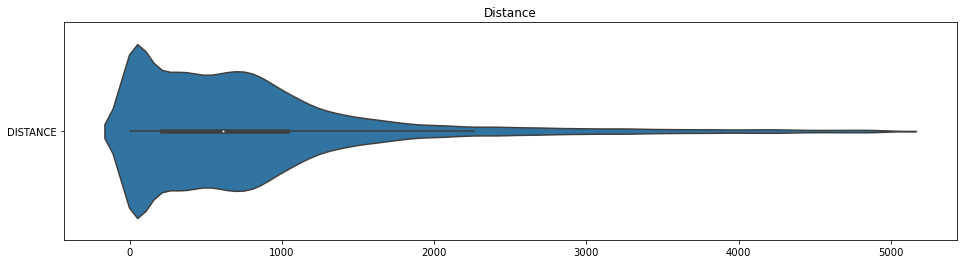

In [63]:
f=plt.figure(figsize=(16,4))
sb.violinplot(data=distance, orient='h').set_title("Distance")

After removing some of the outliers, the data looks much better now. We will keep this step in mind when we do the second round of data cleaning later before proceeding to the machine learning part. We still need to check whether the data removed fall into a specific category.

Next, we look at the distribution of **severity**.

#### Severity

In [64]:
print("Number of Severity :", len(us_acd_16["SEVERITY"].unique()))
print(us_acd_16["SEVERITY"].value_counts())

Number of Severity : 3
2    85545
3    21118
4    13546
1        0
Name: SEVERITY, dtype: int64


Text(0.5, 1.0, 'Severity')

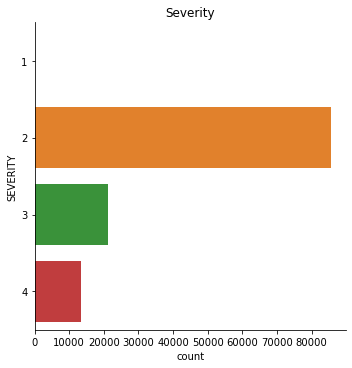

In [65]:
sb.catplot(y = "SEVERITY", data = us_acd_16, kind = "count")
plt.title("Severity")

#### Numeric Predictors (Overview)

We then perform uni-variate visualization on the numeric predictors.

Predictors (numeric) : ```TEMPERATURE``` , ```HUMIDITY```, ```PRESSURE```, ```VISIBILITY```, ```WIND_SPEED```

In [66]:
numDF=pd.DataFrame(us_acd_16[["TEMPERATURE", "HUMIDITY", "PRESSURE", "WIND_SPEED"]])
numDF

,TEMPERATURE,HUMIDITY,PRESSURE,WIND_SPEED
0,42.099998,58.0,29.760000,10.4
1,36.900002,91.0,29.680000,7.0
2,36.000000,97.0,29.700001,7.0
3,39.000000,55.0,29.650000,7.0
4,37.000000,93.0,29.690001,10.4
...,...,...,...,...
137506,31.000000,69.0,29.530001,3.0
150136,31.000000,69.0,29.530001,3.0
150281,31.000000,69.0,29.530001,3.0
158327,31.000000,69.0,29.530001,3.0


Using `describe` to have an overview of the **count**, **mean**, **standard deviation** (denoted by std), **minimum value** (denoted by min), **first quartile** (denoted by 25%), **median** (denoted by 50%), **third quartile** (denoted by 75%) and **maximum value** (denoted by max) of each of the columns of the new dataframe.

In [67]:
numDF.describe()

,TEMPERATURE,HUMIDITY,PRESSURE,WIND_SPEED
count,120209.000000,120209.000000,120209.000000,120209.000000
mean,65.947456,63.069603,30.008379,8.511229
std,17.655672,21.943550,0.298498,5.344234
min,-20.200001,4.000000,3.040000,0.000000
25%,55.900002,48.000000,29.910000,5.800000
50%,68.000000,64.365456,30.010000,7.000000
75%,79.000000,81.000000,30.120001,10.400000
max,129.199997,100.000000,30.920000,822.799988


These are the boxplot, histogram and violin plot for **temperature**, **humidity**, **pressure** and **wind speed**. Here we can see the distribution of our data for each of our predictors.

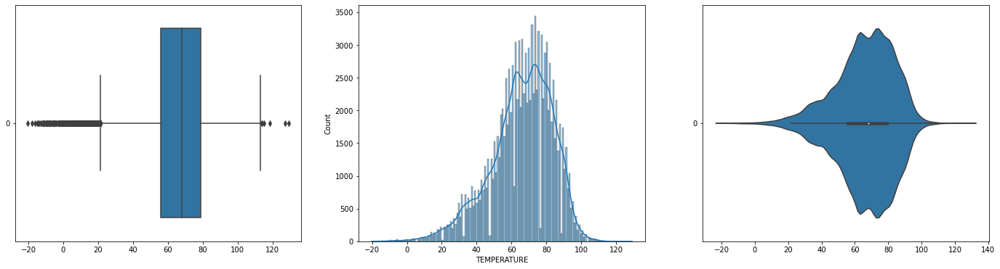

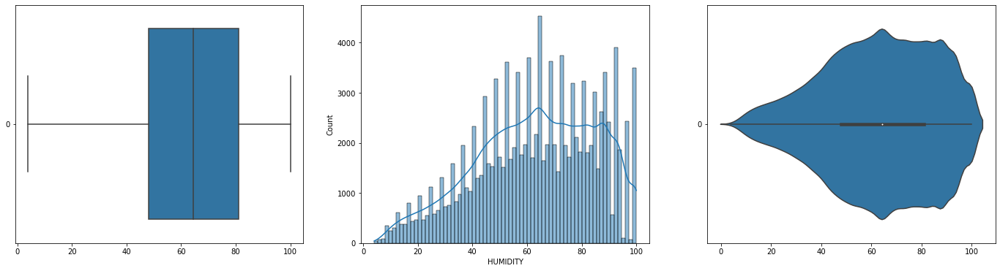

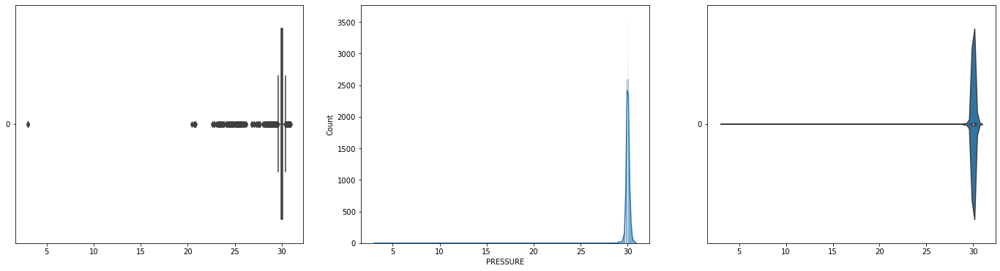

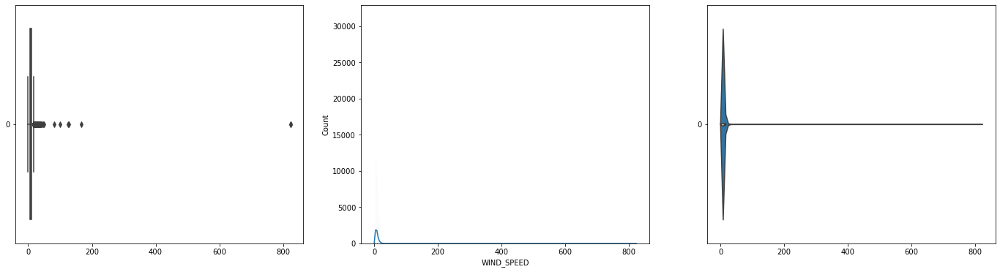

In [68]:
for var in numDF:
    f, axes=plt.subplots(1,3, figsize=(24,6))
    
    sb.boxplot(data=numDF[var], orient='h', ax=axes[0])
    sb.histplot(data=numDF[var], kde=True, ax=axes[1])
    sb.violinplot(data=numDF[var], orient='h', ax=axes[2])

#### Temperature

Once again, the boxplot, histogram plot with kernal density estimate (KDE) and violin plot for **temperature**. Our data is slightly negatively skewed.

<AxesSubplot:>

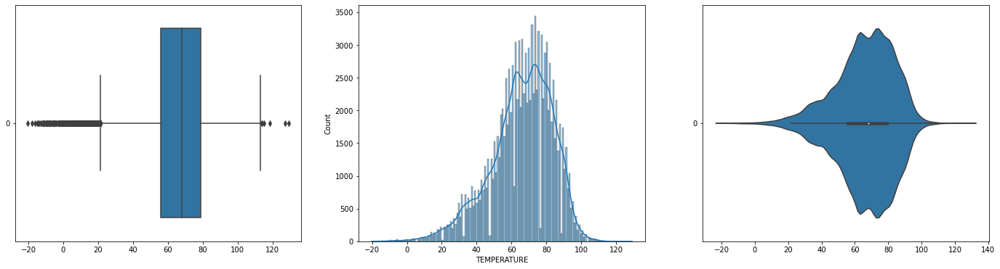

In [69]:
f, axes=plt.subplots(1,3, figsize=(24,6))
    
sb.boxplot(data=us_acd_16["TEMPERATURE"], orient='h', ax=axes[0])
sb.histplot(data=us_acd_16["TEMPERATURE"], kde=True, ax=axes[1])
sb.violinplot(data=us_acd_16["TEMPERATURE"], orient='h', ax=axes[2])

In [70]:
t_ed=us_acd_16[(us_acd_16["TEMPERATURE"]>120) | (us_acd_16["TEMPERATURE"]<0)]
t_ed.shape

(155, 17)

The categorical plot below shows the **severity** level which the outliers above fall in, with the severity categorised **2** holding the greatest count, followed by **3** and **4**.

Text(0.5, 1.0, 'Severity')

<Figure size 864x576 with 0 Axes>

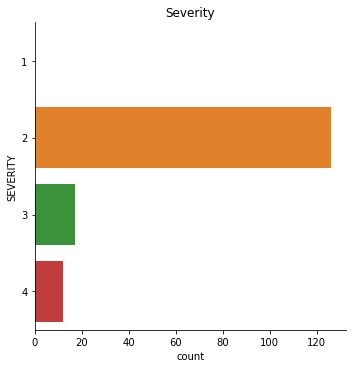

In [71]:
f=plt.figure(figsize=(12,8))
sb.catplot(y="SEVERITY", data=t_ed, kind="count") #t_ed is dataframe of outliers
plt.title("Severity")

In [72]:
t_ed["SEVERITY"].value_counts() #t_ed is dataframe of outliers

2    126
3     17
4     12
1      0
Name: SEVERITY, dtype: int64

####  Humidity

Here are the boxplot, histogram plot with kernal density estimate (KDE) and violin plot for **humidity**. Our data is negatively skewed.

<AxesSubplot:>

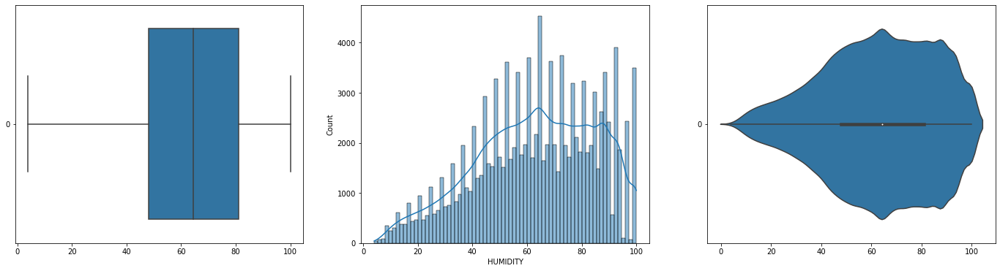

In [73]:
f, axes=plt.subplots(1,3, figsize=(24,6))
    
sb.boxplot(data=us_acd_16["HUMIDITY"], orient='h', ax=axes[0])
sb.histplot(data=us_acd_16["HUMIDITY"], kde=True, ax=axes[1])
sb.violinplot(data=us_acd_16["HUMIDITY"], orient='h', ax=axes[2])

Since the data is relatively well distributed, we do not intend to make any changes.

#### Pressure

Here are the boxplot, histogram plot with kernal density estimate (KDE) and violin plot for **pressure**. Our data is negatively skewed, with a very thin standard deviation as indicated by the width of violin plot.

<AxesSubplot:>

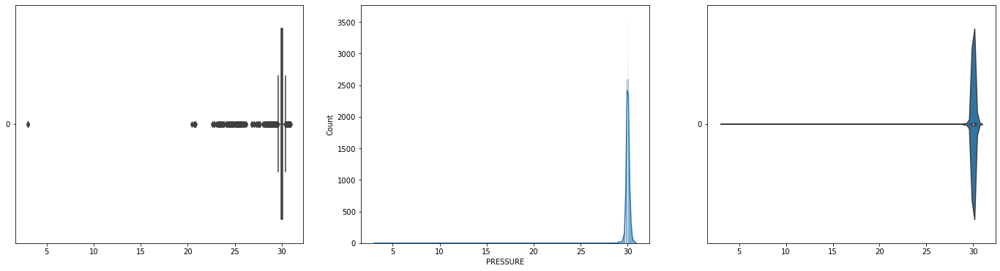

In [74]:
f, axes=plt.subplots(1,3, figsize=(24,6))
    
sb.boxplot(data=us_acd_16["PRESSURE"], orient='h', ax=axes[0])
sb.histplot(data=us_acd_16["PRESSURE"], kde=True, ax=axes[1])
sb.violinplot(data=us_acd_16["PRESSURE"], orient='h', ax=axes[2])

In [75]:
p_ed=us_acd_16[(us_acd_16["PRESSURE"]>35) | (us_acd_16["PRESSURE"]<27)]
p_ed.shape

(159, 17)

The categorical plot below shows the severity level which the outliers above fall in, with the severity categorised **2** holding the greatest count, followed by **4** and **3**.

Text(0.5, 1.0, 'Severity')

<Figure size 864x576 with 0 Axes>

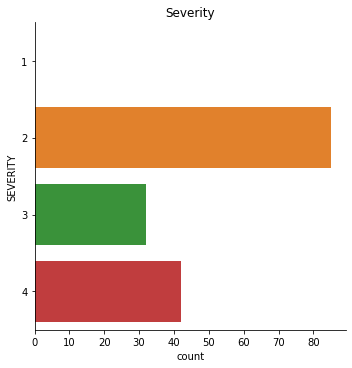

In [76]:
f=plt.figure(figsize=(12,8))
sb.catplot(y="SEVERITY", data=p_ed, kind="count") #p_ed is dataframe of outliers
plt.title("Severity")

In [77]:
p_ed["SEVERITY"].value_counts() #p_ed is dataframe of outliers

2    85
4    42
3    32
1     0
Name: SEVERITY, dtype: int64

#### Wind Speed

Here are the boxplot, histogram plot with kernal density estimate (KDE) and violin plot for **wind speed**. Our data is positively skewed, with very thin standard deviation as indicated by the width of violin plot.

<AxesSubplot:>

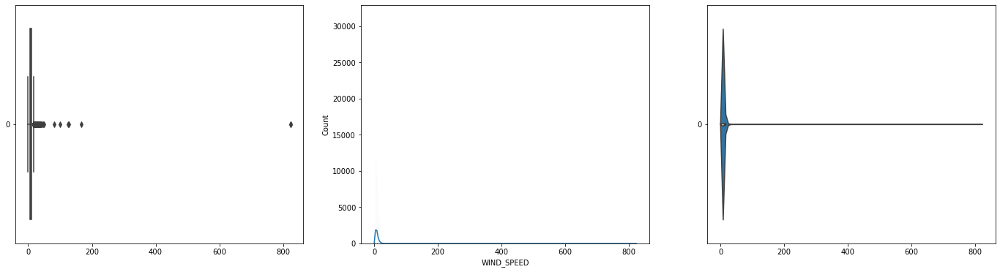

In [78]:
f, axes=plt.subplots(1,3, figsize=(24,6))
    
sb.boxplot(data=us_acd_16["WIND_SPEED"], orient='h', ax=axes[0])
sb.histplot(data=us_acd_16["WIND_SPEED"], kde=True, ax=axes[1])
sb.violinplot(data=us_acd_16["WIND_SPEED"], orient='h', ax=axes[2])

In [79]:
ws_ed=us_acd_16[us_acd_16["WIND_SPEED"]>25]
ws_ed.shape

(508, 17)

The categorical plot below shows the severity level which the outliers above fall in, with the severity categorised **2** holding the greatest count, followed by **4** and **3**.

Text(0.5, 1.0, 'Severity')

<Figure size 864x576 with 0 Axes>

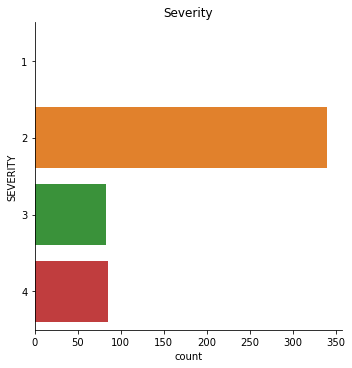

In [80]:
f=plt.figure(figsize=(12,8))
sb.catplot(y="SEVERITY", data=ws_ed, kind="count") #w_ed is dataframe of outliers
plt.title("Severity")

In [81]:
ws_ed["SEVERITY"].value_counts() #w_ed is dataframe of outliers

2    340
4     85
3     83
1      0
Name: SEVERITY, dtype: int64

#### Numeric Predictors (Overview)

Now we will drop the outliers from our data. This applies for **temperature**, **pressure** and **wind speed**.

In [82]:
numDF.drop(numDF.index[(numDF["TEMPERATURE"]>120) | (numDF["TEMPERATURE"]<0) | 
                       (numDF["PRESSURE"]>35) | (numDF["PRESSURE"]<27) | 
                       (numDF["WIND_SPEED"]>25)], inplace=True)
numDF.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 119392 entries, 0 to 161276
Data columns (total 4 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   TEMPERATURE  119392 non-null  float32
 1   HUMIDITY     119392 non-null  float32
 2   PRESSURE     119392 non-null  float32
 3   WIND_SPEED   119392 non-null  float32
dtypes: float32(4)
memory usage: 2.7 MB


After dropping the outliers, these are the boxplot, histogram with kernel density estimate (KDE) and violin plot for **temperature**, **humidity**, **pressure** and **wind speed** respectively.

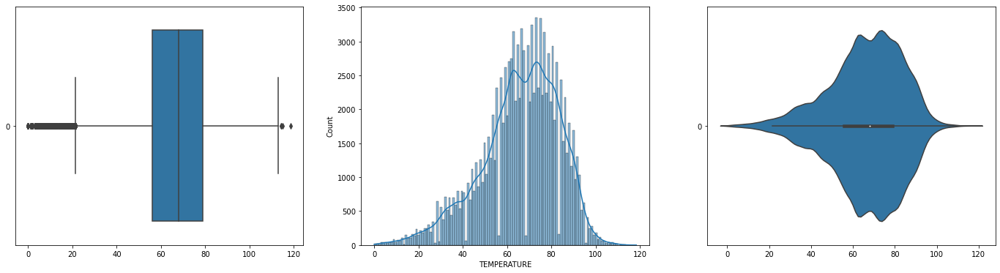

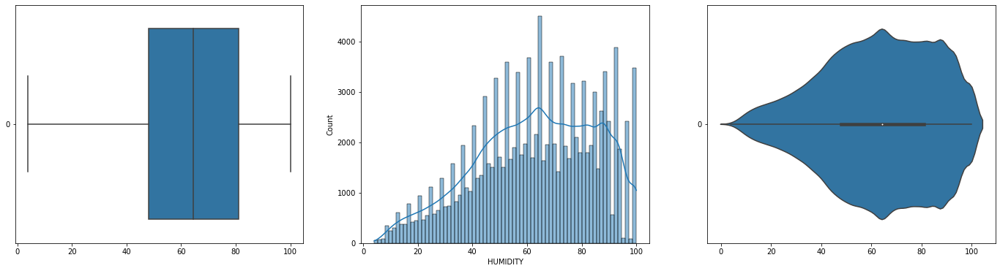

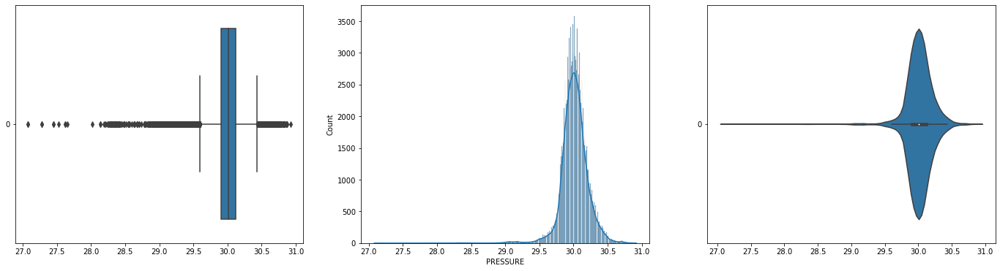

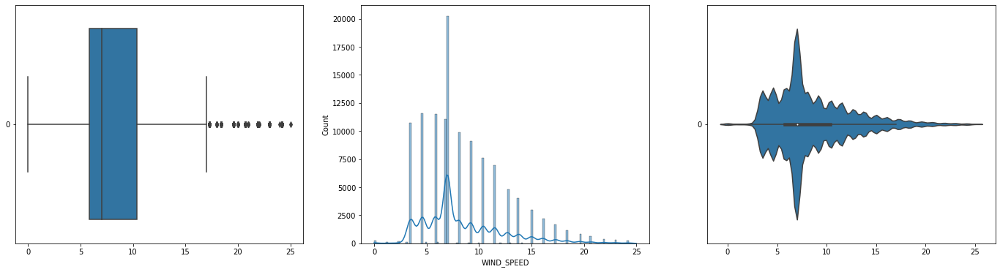

In [83]:
for var in numDF:
    f, axes=plt.subplots(1,3, figsize=(24,6))
    
    sb.boxplot(data=numDF[var], orient='h', ax=axes[0])
    sb.histplot(data=numDF[var], kde=True, ax=axes[1])
    sb.violinplot(data=numDF[var], orient='h', ax=axes[2])

#### Categorical Predictors (Overview)

Predictors (categorical) : ```SIDE``` , ```STATE```, ```WEATHER_CONDITION```, ```CROSSING```, ```JUNCTION```, ```TRAFFIC_SIGNAL```, ```DAY_NIGHT```

In [84]:
catDF=pd.DataFrame(us_acd_16[["SIDE", "STATE", "WEATHER_CONDITION", "CROSSING", "JUNCTION", "TRAFFIC_SIGNAL", "DAY_NIGHT"]])
catDF

,SIDE,STATE,WEATHER_CONDITION,CROSSING,JUNCTION,TRAFFIC_SIGNAL,DAY_NIGHT
0,R,Ohio,Light Rain,False,False,False,Night
1,R,Ohio,Light Rain,False,False,False,Night
2,R,Ohio,Partly Cloudy,False,True,False,Night
3,R,Ohio,Partly Cloudy,False,False,False,Night
4,R,Ohio,Light Rain,False,False,False,Day
...,...,...,...,...,...,...,...
137506,R,Pennsylvania,Fair,False,False,False,Night
150136,R,Pennsylvania,Fair,False,False,False,Night
150281,R,Pennsylvania,Fair,False,False,False,Night
158327,R,Pennsylvania,Fair,False,False,False,Night


Now we use `describe` to have an overview of the **count**, **unique**, **top** and **freq** of our categorical predictors.


In [85]:
catDF.describe()

,SIDE,STATE,WEATHER_CONDITION,CROSSING,JUNCTION,TRAFFIC_SIGNAL,DAY_NIGHT
count,120209,120209,120209,120209,120209,120209,120209
unique,2,49,15,2,2,2,3
top,R,California,Clear,False,False,False,Day
freq,108171,33269,47268,114397,94899,109065,88878


#### Side

This is the categorical plot for **side**, with **right side** dominating in the distirbution of data.

In [86]:
us_acd_16["SIDE"].value_counts()

R    108171
L     12038
Name: SIDE, dtype: int64

Text(0.5, 1.0, 'Side')

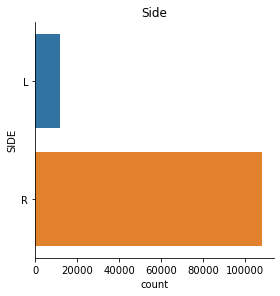

In [87]:
sb.catplot(y="SIDE", data=us_acd_16, kind="count", height=4)
plt.title("Side")

This is the categorical plot for **side** with **day / night**, also with **right side and day time** dominating in the distribution of data.

Text(0.5, 1.0, 'Side w Day Night')

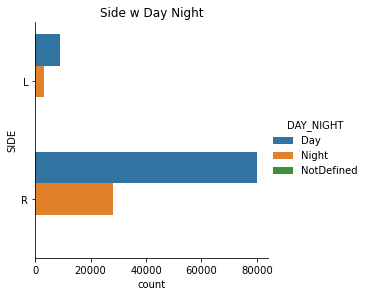

In [88]:
sb.catplot(y="SIDE", data=us_acd_16, kind="count", height=4, hue="DAY_NIGHT")
plt.title("Side w Day Night")

#### State

Here is the categorical plot of **states** involving the car accidents, with **California** reporting the most cases.

In [89]:
us_acd_16["STATE"].value_counts()

California              33269
Texas                    9070
Florida                  8705
New York                 6781
Illinois                 6677
North Carolina           4255
New Jersey               3798
Ohio                     3777
Pennsylvania             3390
Michigan                 2974
Washington               2858
Georgia                  2829
Arizona                  2694
Missouri                 2671
Minnesota                2514
Virginia                 2501
Connecticut              1995
Maryland                 1904
Tennessee                1616
Indiana                  1538
Wisconsin                1484
Colorado                 1284
Nevada                   1239
Kentucky                 1037
South Carolina            978
Utah                      916
Oregon                    915
Massachusetts             814
Louisiana                 797
Iowa                      654
Rhode Island              617
Oklahoma                  514
Kansas                    442
Idaho     

Text(0.5, 1.0, 'State')

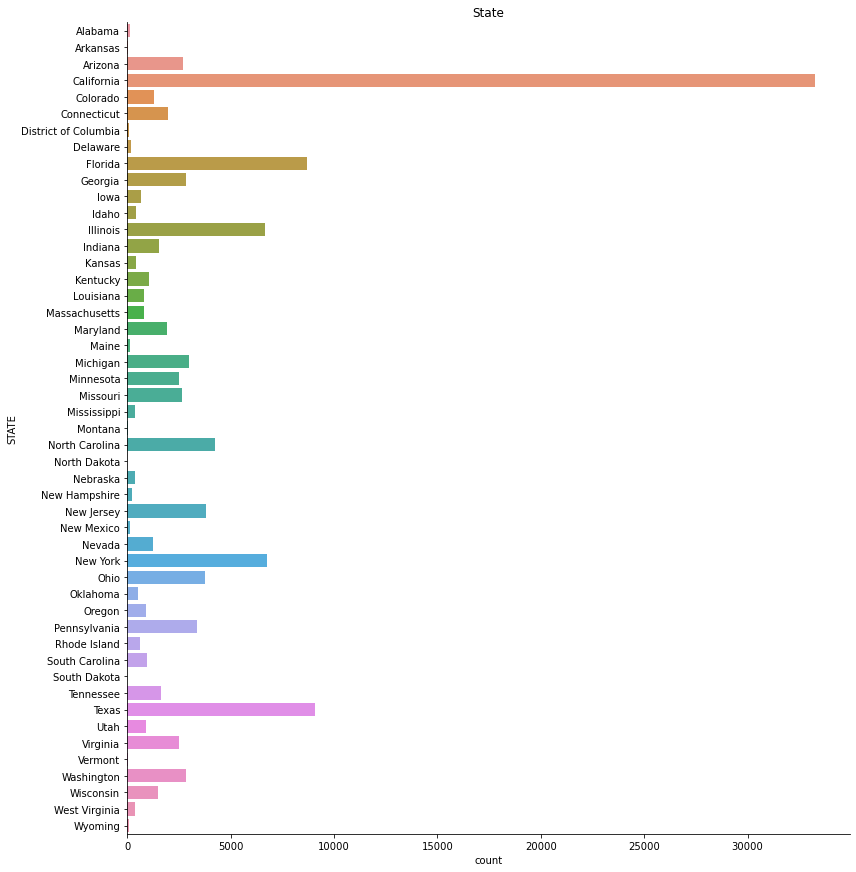

In [90]:
sb.catplot(y="STATE", data=us_acd_16, kind="count", height=12)
plt.title("State")

This is the categorical plot for **state** with **day / night**, also with **California and day time** dominating in the distirbution of data.

Text(0.5, 1.0, 'State w Day Night')

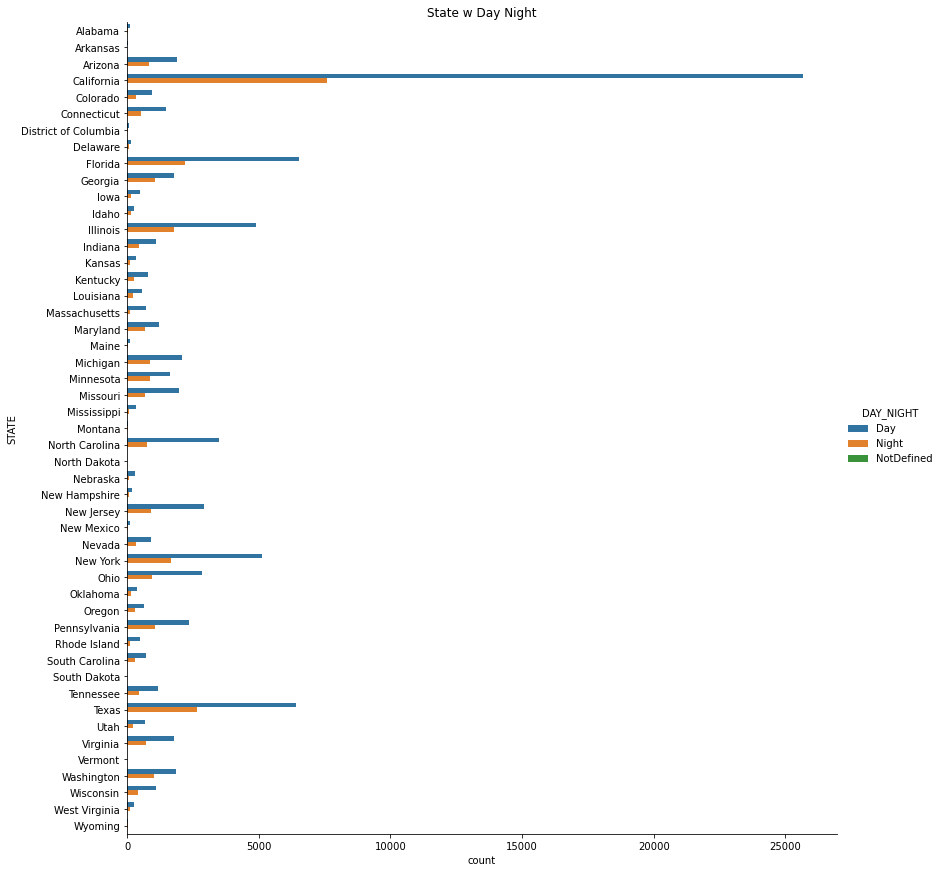

In [91]:
sb.catplot(y="STATE", data=us_acd_16, kind="count", height=12, hue="DAY_NIGHT")
plt.title("State w Day Night")

#### Weather Condition

This is the categorical plot for **weather conditions**, with the **clear weather** dominating the distribution of data.

In [92]:
us_acd_16["WEATHER_CONDITION"].value_counts()

Clear            47268
Partly Cloudy    30365
Mostly Cloudy    17235
Cloudy           12924
Light Rain        4983
Fog               2062
NotDefined        1076
Light Snow        1070
Rain              1034
Thunder            955
Fair               710
Heavy Rain         358
Snow               147
Heavy Snow          21
Tornado              1
Name: WEATHER_CONDITION, dtype: int64

Text(0.5, 1.0, 'Weather Condition')

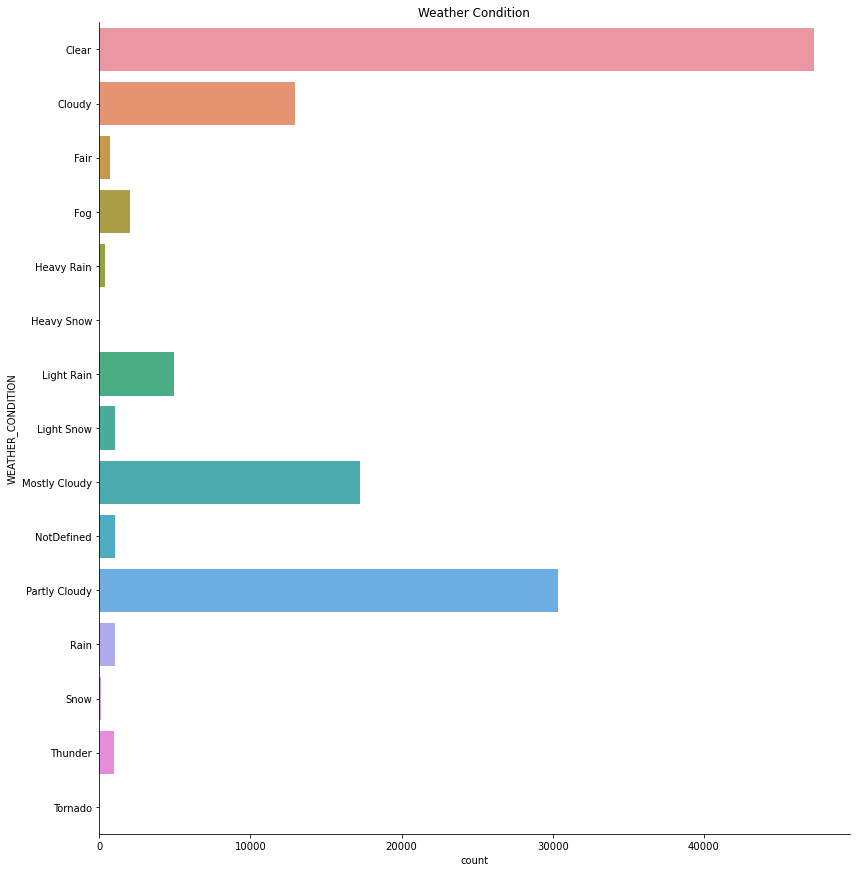

In [93]:
sb.catplot(y="WEATHER_CONDITION", data=us_acd_16, kind="count", height=12)
plt.title("Weather Condition")

#### Crossing

This categorical plot suggests that car accidents in the United States most commonly happened when there are **no crossings**.

In [94]:
us_acd_16["CROSSING"].value_counts()

False    114397
True       5812
Name: CROSSING, dtype: int64

Text(0.5, 1.0, 'Crossing')

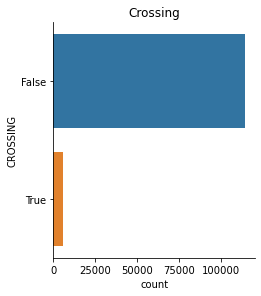

In [95]:
sb.catplot(y="CROSSING", data=us_acd_16, kind="count", height=4)
plt.title("Crossing")

This categorical plot suggests that car accidents in the United States most commonly happened when there are **no crossings during the day**.

Text(0.5, 1.0, 'Crossing w Day Night')

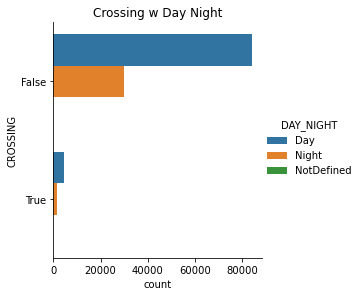

In [96]:
sb.catplot(y="CROSSING", data=us_acd_16, kind="count", height=4, hue="DAY_NIGHT")
plt.title("Crossing w Day Night")

#### Junction

This categorical plot suggests that car accidents in the United States most commonly happened when there are **no junctions**.

In [97]:
us_acd_16["JUNCTION"].value_counts()

False    94899
True     25310
Name: JUNCTION, dtype: int64

Text(0.5, 1.0, 'Junction')

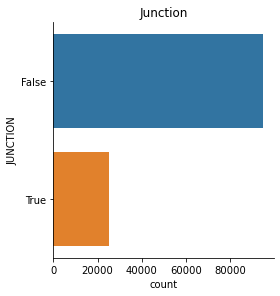

In [98]:
sb.catplot(y="JUNCTION", data=us_acd_16, kind="count", height=4)
plt.title("Junction")

This categorical plot suggests that car accidents in the United States most commonly happened when there are **no junctions during the day**.

Text(0.5, 1.0, 'Junction w Day Night')

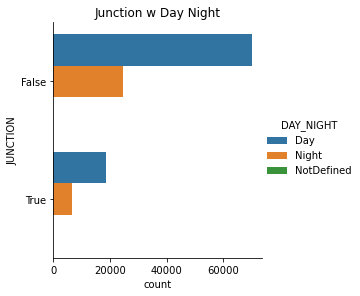

In [99]:
sb.catplot(y="JUNCTION", data=us_acd_16, kind="count", height=4, hue="DAY_NIGHT")
plt.title("Junction w Day Night")

#### Traffic Signal

This categorical plot suggests that car accidents in the United States most commonly happened when there are **no traffic signal**.

In [100]:
us_acd_16["TRAFFIC_SIGNAL"].value_counts()

False    109065
True      11144
Name: TRAFFIC_SIGNAL, dtype: int64

Text(0.5, 1.0, 'Traffic Signal')

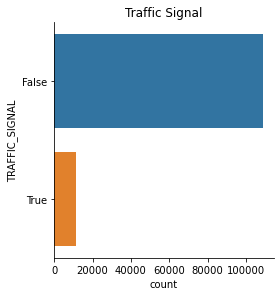

In [101]:
sb.catplot(y="TRAFFIC_SIGNAL", data=us_acd_16, kind="count", height=4)
plt.title("Traffic Signal")

This categorical plot suggests that car accidents in the United States most commonly happened when there are **no traffic signal during the day**.

Text(0.5, 1.0, 'Traffic Signal w Day Night')

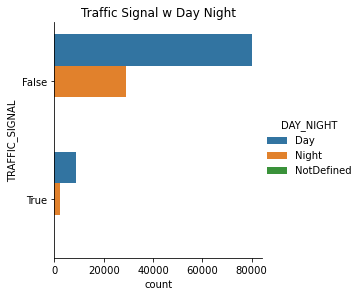

In [102]:
sb.catplot(y="TRAFFIC_SIGNAL", data=us_acd_16, kind="count", height=4, hue="DAY_NIGHT")
plt.title("Traffic Signal w Day Night")

#### Day / Night

This categorical plot suggests that car accidents in the United States most commonly happened during **day time**.

In [103]:
us_acd_16["DAY_NIGHT"].value_counts()

Day           88878
Night         31319
NotDefined       12
Name: DAY_NIGHT, dtype: int64

Text(0.5, 1.0, 'Day Night')

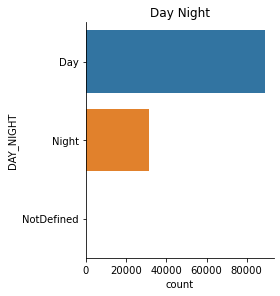

In [104]:
sb.catplot(y="DAY_NIGHT", data=us_acd_16, kind="count", height=4)
plt.title("Day Night")

## Data Preparation and Data Cleaning 2

Now, like how we did for `numDF`, we drop the outliers from `us_acd_16` and create a new dataframe `us_acd_16cln`.

In [105]:
us_acd_16cln=us_acd_16.copy()

In [106]:
us_acd_16cln.drop(us_acd_16cln.index[(us_acd_16cln["TEMPERATURE"]>120) | (us_acd_16cln["TEMPERATURE"]<0) | 
                  (us_acd_16cln["PRESSURE"]>35) | (us_acd_16cln["PRESSURE"]<27) | (us_acd_16cln["WIND_SPEED"]>25) |
                  (us_acd_16cln["DISTANCE"]>5000)], inplace=True)
us_acd_16cln.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 114829 entries, 1 to 161276
Data columns (total 17 columns):
 #   Column             Non-Null Count   Dtype         
---  ------             --------------   -----         
 0   ID                 114829 non-null  category      
 1   TIME               114829 non-null  datetime64[ns]
 2   LATITUDE           114829 non-null  float32       
 3   LONGITUDE          114829 non-null  float32       
 4   SIDE               114829 non-null  category      
 5   STATE              114829 non-null  category      
 6   TEMPERATURE        114829 non-null  float32       
 7   HUMIDITY           114829 non-null  float32       
 8   PRESSURE           114829 non-null  float32       
 9   WIND_SPEED         114829 non-null  float32       
 10  WEATHER_CONDITION  114829 non-null  category      
 11  CROSSING           114829 non-null  category      
 12  JUNCTION           114829 non-null  category      
 13  TRAFFIC_SIGNAL     114829 non-null  category

## Exploratory Data Analysis and Visualization

In [107]:
us_acd_16cln.describe()

,LATITUDE,LONGITUDE,TEMPERATURE,HUMIDITY,PRESSURE,WIND_SPEED,DISTANCE
count,114829.000000,114829.000000,114829.000000,114829.000000,114829.000000,114829.000000,114829.000000
mean,36.991810,-96.642418,66.268509,62.931385,30.016050,8.414013,800.765225
std,4.823619,18.002386,17.304811,21.888943,0.189900,3.911053,853.998025
min,25.162298,-124.422615,-0.000000,4.000000,27.280001,0.000000,0.000000
25%,33.853748,-117.860367,55.900002,48.000000,29.910000,5.800000,212.432879
50%,37.594028,-90.535553,68.000000,64.000000,30.010000,7.000000,609.939873
75%,40.758282,-80.882011,79.000000,81.000000,30.120001,10.400000,1029.977577
max,48.990559,-67.849854,118.400002,100.000000,30.920000,25.000000,4998.609954


These are the boxplot, histogram with kernel density estimation and violin plot for **distance**.

<AxesSubplot:xlabel='DISTANCE'>

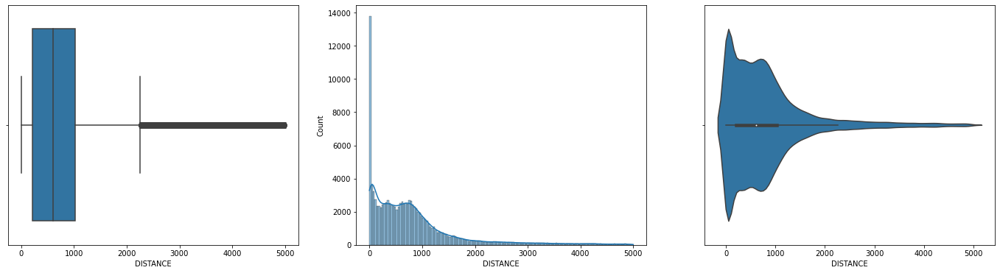

In [108]:
f, axes=plt.subplots(1,3, figsize=(24,6))
    
sb.boxplot(x=us_acd_16cln["DISTANCE"], orient='h', ax=axes[0])
sb.histplot(x=us_acd_16cln["DISTANCE"], kde=True, ax=axes[1])
sb.violinplot(x=us_acd_16cln["DISTANCE"], orient='h', ax=axes[2])

This is the categorical plot for **severity**.

In [109]:
us_acd_16cln["SEVERITY"].value_counts()

2    82960
3    20435
4    11434
1        0
Name: SEVERITY, dtype: int64

Text(0.5, 1.0, 'Severity')

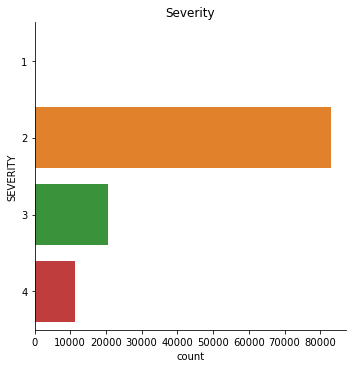

In [110]:
sb.catplot(y = "SEVERITY", data = us_acd_16cln, kind = "count")
plt.title("Severity")

Predictors (Numerical Variables).Once again, we have a look at the boxplot, histogram with kernel density estimation and violin plot of **temperature**, **humidity**, **pressure** and **wind speed** respectively.

In [111]:
num_lst=("TEMPERATURE", "HUMIDITY", "PRESSURE", "WIND_SPEED")

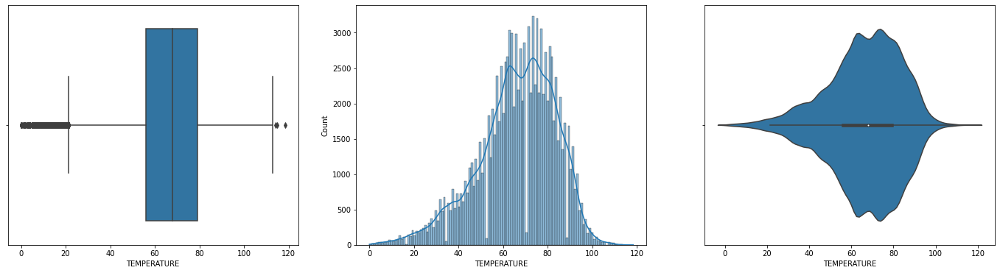

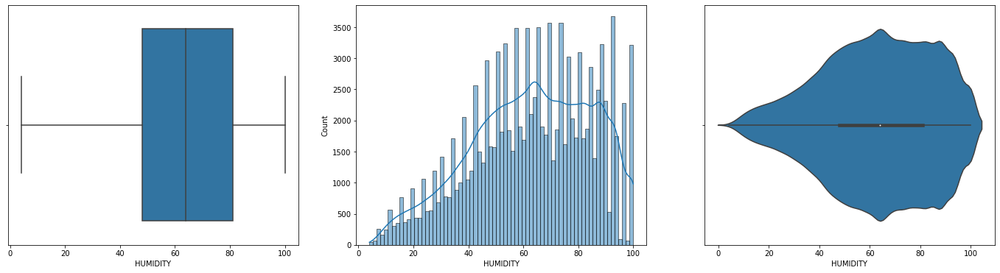

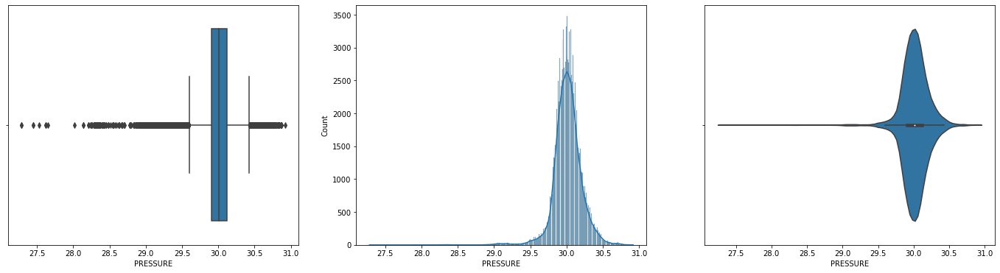

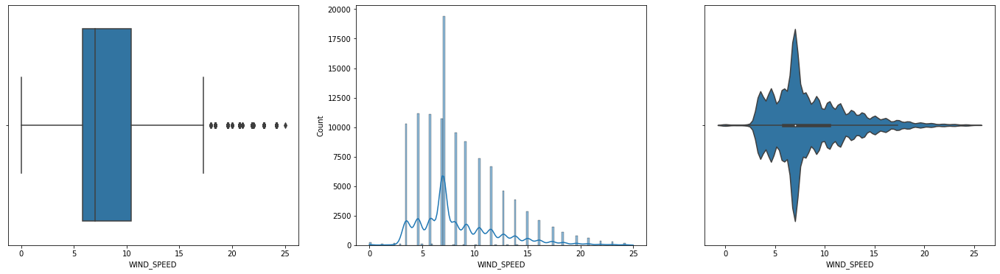

In [112]:
for var in num_lst:
    f, axes=plt.subplots(1,3, figsize=(24,6))
    
    sb.boxplot(x=us_acd_16cln[var], orient='h', ax=axes[0])
    sb.histplot(x=us_acd_16cln[var], kde=True, ax=axes[1])
    sb.violinplot(x=us_acd_16cln[var], orient='h', ax=axes[2])

Predictors (Categorical Variables). Once again, we have a look at the categorical plot of **side**, **state**, **weather condition**, **junction**, **traffic signal** and **day / night** respectively.

In [113]:
cat_lst=("SIDE", "STATE", "WEATHER_CONDITION", "CROSSING", "JUNCTION", "TRAFFIC_SIGNAL", "DAY_NIGHT")

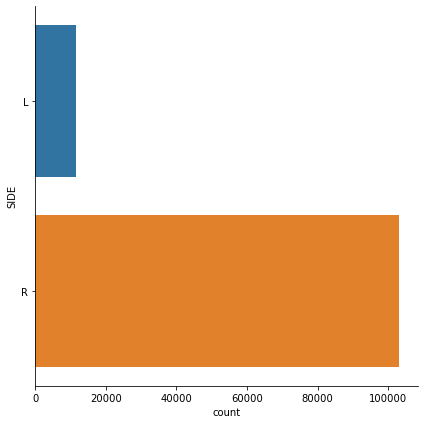

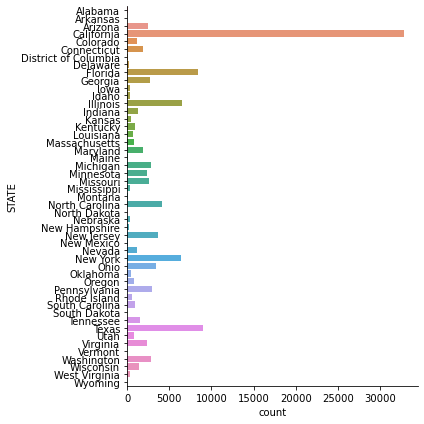

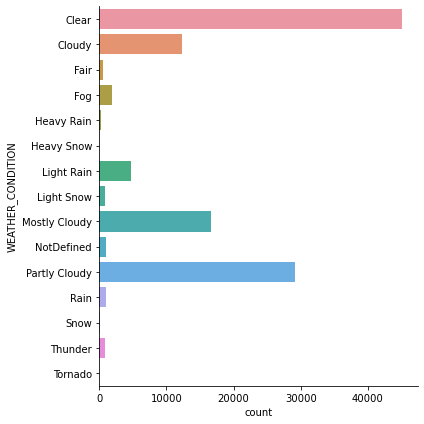

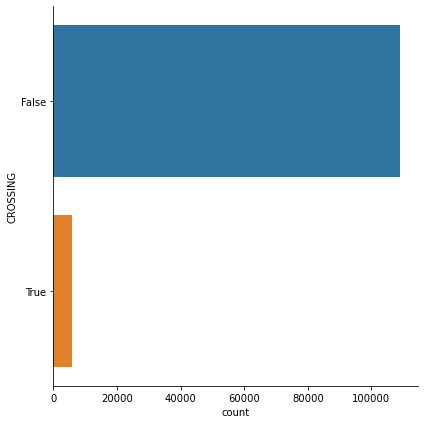

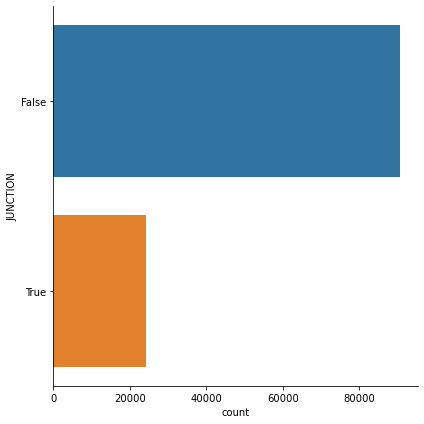

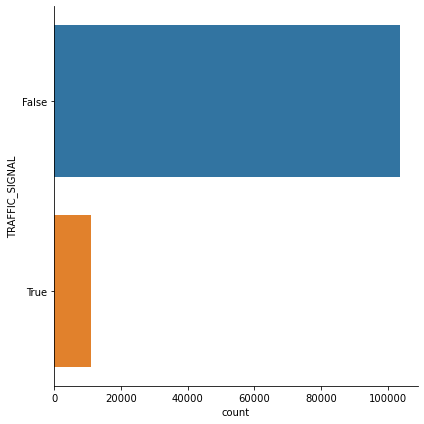

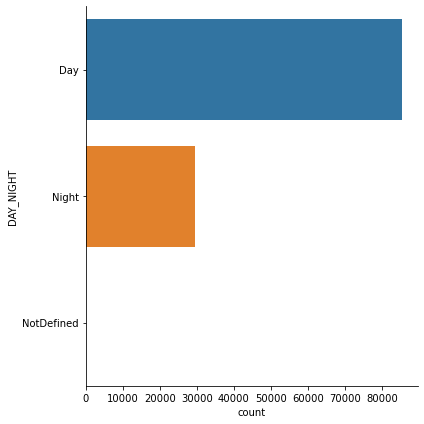

In [114]:
for var in cat_lst:
    sb.catplot(y=var, data=us_acd_16cln, kind="count", height=6)

### Relationship between the Response Variables

This is the boxplot of **severity** against **distance**. Our boxplot clearly shows us that as the severity increases, so as the distance incurred, which turns out to be true as more severe accidents typically caused longer stretch of the road being affected by the accident.

Text(0.5, 1.0, 'Distance vs Severity')

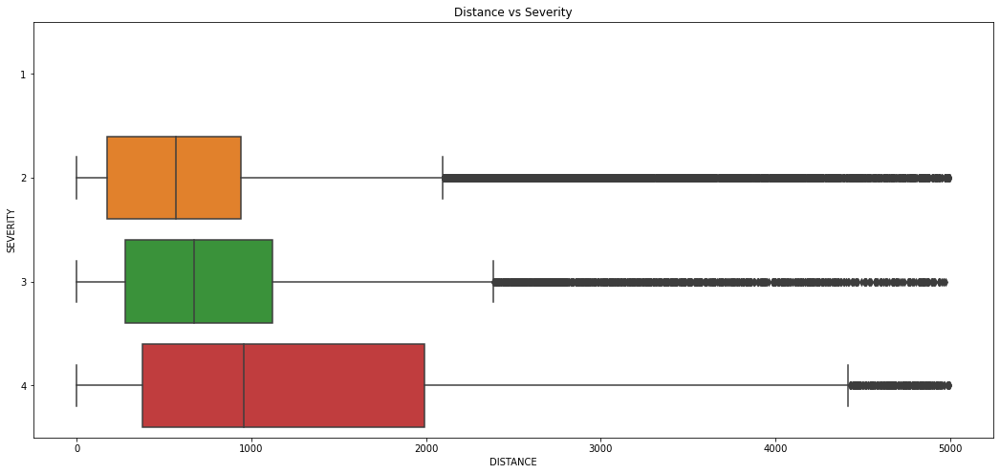

In [115]:
f = plt.figure(figsize=(18, 8))
sb.boxplot(x="DISTANCE", y="SEVERITY", data=us_acd_16cln, orient='h').set_title("Distance vs Severity")

### Relationship between Time and Accident Occurence

The histogram below shows the distribution of time of the car accidents.

Text(0.5, 1.0, 'Time')

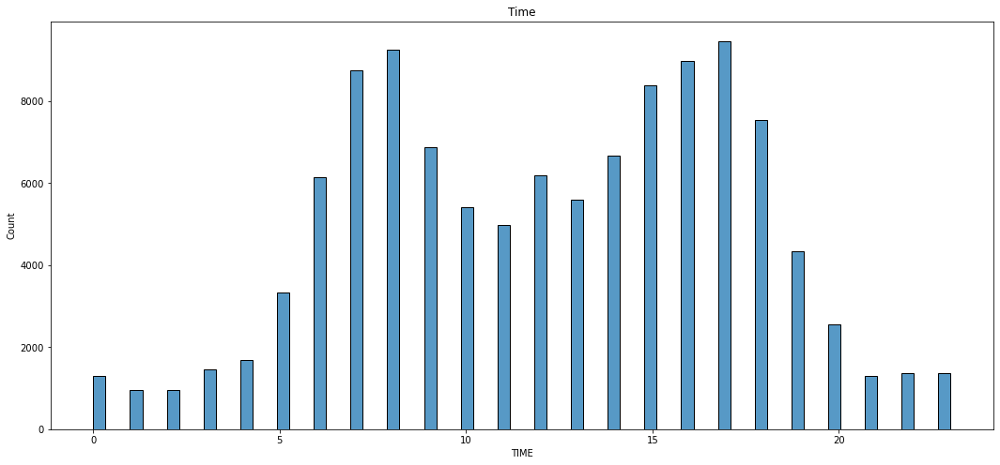

In [116]:
f = plt.figure(figsize=(18, 8))
sb.histplot(data=us_acd_16cln["TIME"].dt.hour).set_title("Time")

As we can see, most accidents happen during rush hours, where traffic congestion on roads is at its peak.

### Geospatial Visualization

The map below gives us an overview on the hotspots in the United States where accidents happen.

In [117]:
us_acd_16_cord=us_acd_16cln[["LATITUDE", "LONGITUDE"]].to_numpy()
us_acd_16_cord

array([[ 39.86542 , -84.0628  ],
       [ 39.10266 , -84.52468 ],
       [ 41.06213 , -81.53784 ],
       ...,
       [ 40.630608, -75.470604],
       [ 40.630608, -75.470604],
       [ 40.630608, -75.470604]], dtype=float32)

In [118]:
import folium
from folium import plugins
from branca.element import Figure

us_lat=37.0902
us_lng=-95.7129

In [119]:
fig=Figure(width=900, height=600)

us=folium.Map(width=900, height=600,
             location=[us_lat, us_lng],
             zoom_start=4, min_zoom=3, max_zoom=12)
fig.add_child(us)

plugins.HeatMap(us_acd_16_cord, radius=5, blur=3).add_to(us)

Washington_lat=47.751076
Washington_lng=-120.740135
NYC_lat=43.000000
NYC_lng=-75.000000

folium.Marker(location=[Washington_lat, Washington_lng], 
              popup=[Washington_lat, Washington_lng], 
              tooltip="Washington", 
              icon=folium.Icon(color="blue", icon="info-sign")).add_to(us)
folium.Marker(location=[NYC_lat, NYC_lng], 
              popup=[NYC_lat, NYC_lng],
              tooltip="New York",
              icon=folium.Icon(color="red", icon="info-sign")).add_to(us)

us

### Statistical Summary: Numerical Variables (Multi-variate) vs Distance (Numeric)

In [120]:
num_var=pd.DataFrame(us_acd_16cln[["TEMPERATURE", "HUMIDITY", "PRESSURE", "WIND_SPEED", "DISTANCE"]])

This shows the correlation values (in table, heatmap and grid pair) between multi-variables.

In [121]:
num_var.corr()

,TEMPERATURE,HUMIDITY,PRESSURE,WIND_SPEED,DISTANCE
TEMPERATURE,1.000000,-0.372184,-0.289403,0.008409,-0.058118
HUMIDITY,-0.372184,1.000000,0.037095,-0.169335,0.024857
PRESSURE,-0.289403,0.037095,1.000000,-0.129952,0.000680
WIND_SPEED,0.008409,-0.169335,-0.129952,1.000000,-0.002120
DISTANCE,-0.058118,0.024857,0.000680,-0.002120,1.000000


<AxesSubplot:>

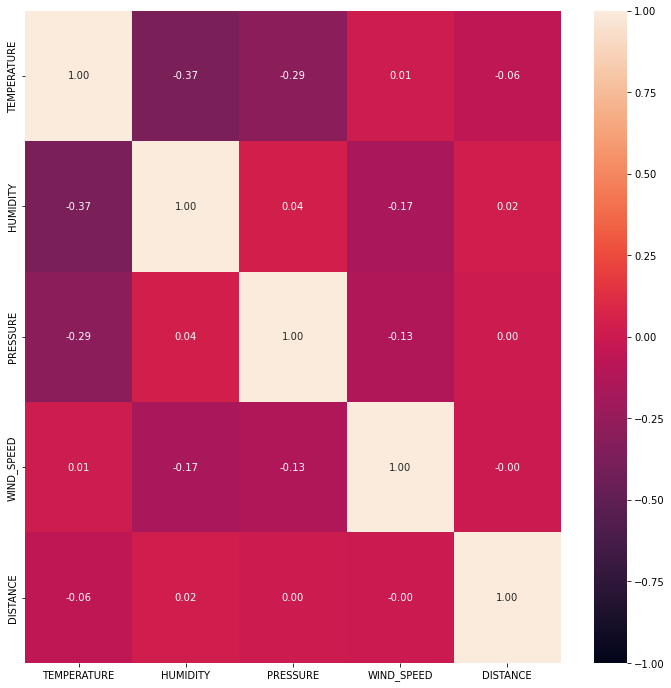

In [122]:
f = plt.figure(figsize=(12, 12))
sb.heatmap(num_var.corr(), vmin = -1, vmax = 1, annot = True, fmt = ".2f")

A pairplot here is not ideal for visualization as the data contains around 100k++ data points.

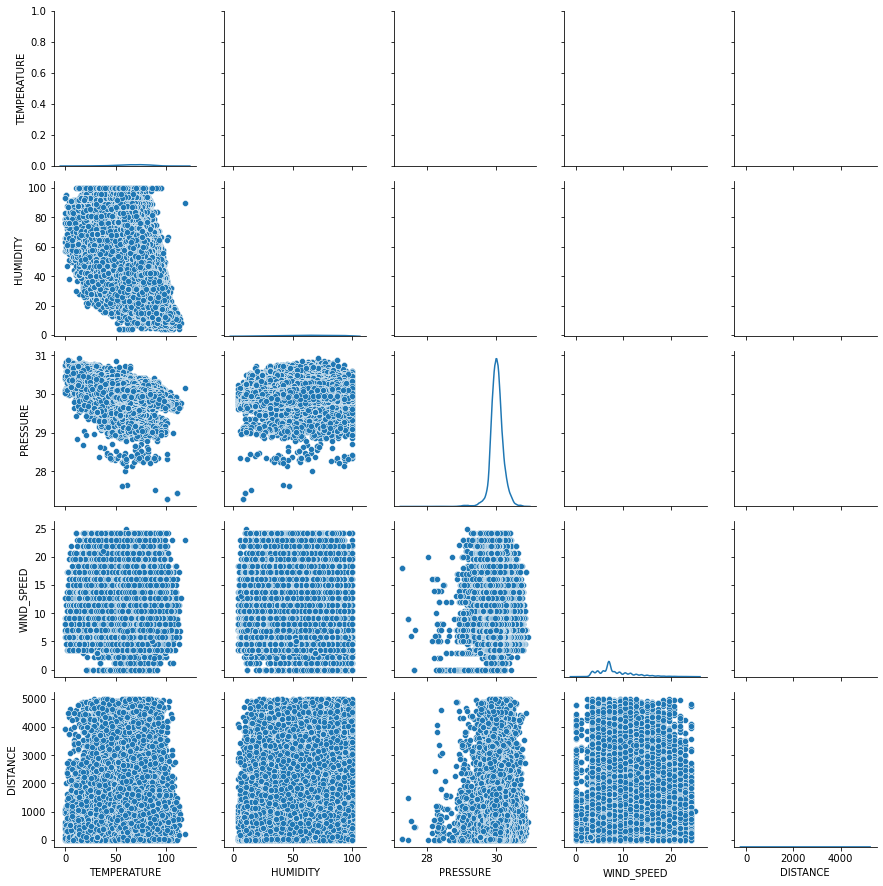

In [123]:
fig_pairGrid=sb.PairGrid(num_var)
fig_pairGrid.map_lower(sb.scatterplot)
fig_pairGrid.map_diag(sb.kdeplot)

We can see that the correlation between distance and all the numerical predictors is extremely low. Perhaps this can be explained from the pairplot, where we can deduce that there is no linear relationship between the numerical variables and distance. Later we shall combine more variables together and see whether we can get a better inference.

### Statistical Summary: Categorical Variables vs Severity (Categorical)

#### Distribution of Side for Every Level of Severity

Here we show the distribution of side against each form of severity in terms of categorical plot and heatmap.

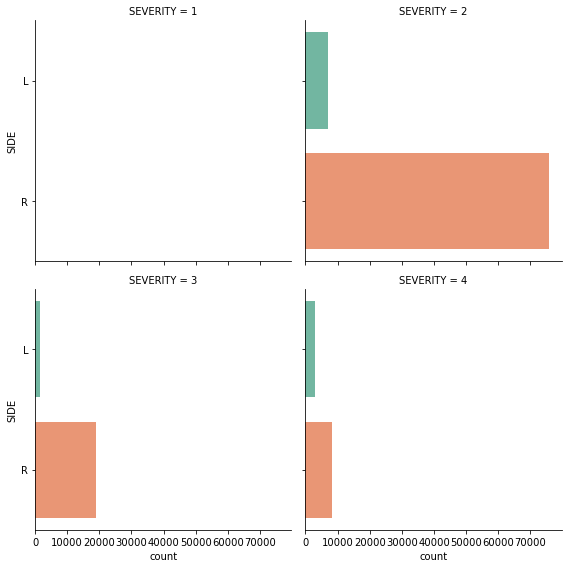

In [124]:
sb.catplot(y = 'SIDE', data = us_acd_16cln, col = 'SEVERITY', kind = 'count', col_wrap = 2, height = 4, 
           palette='Set2')

Text(0.5, 1.0, 'Side vs Severity')

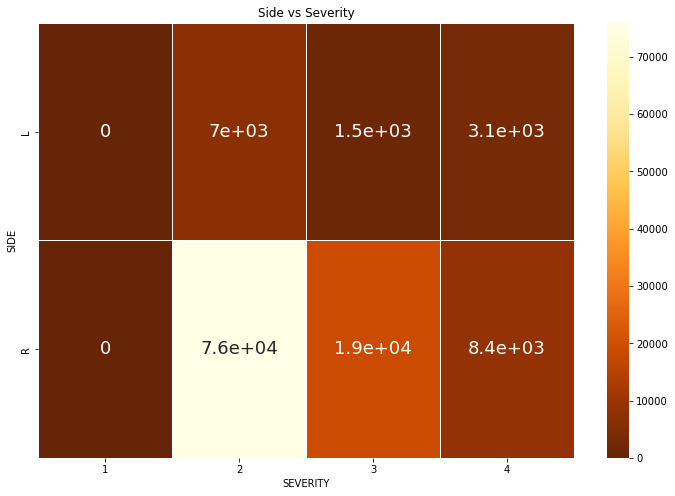

In [125]:
f = plt.figure(figsize=(12, 8))
sb.heatmap(us_acd_16cln.groupby(['SIDE', 'SEVERITY']).size().unstack(), 
           linewidths = 1, annot = True, annot_kws = {"size": 18}, cmap = "YlOrBr_r")
plt.title("Side vs Severity")

#### Distribution of State for Every Level of Severity

Here we show the distribution of state against each form of severity in terms of categorical plot and heatmap.

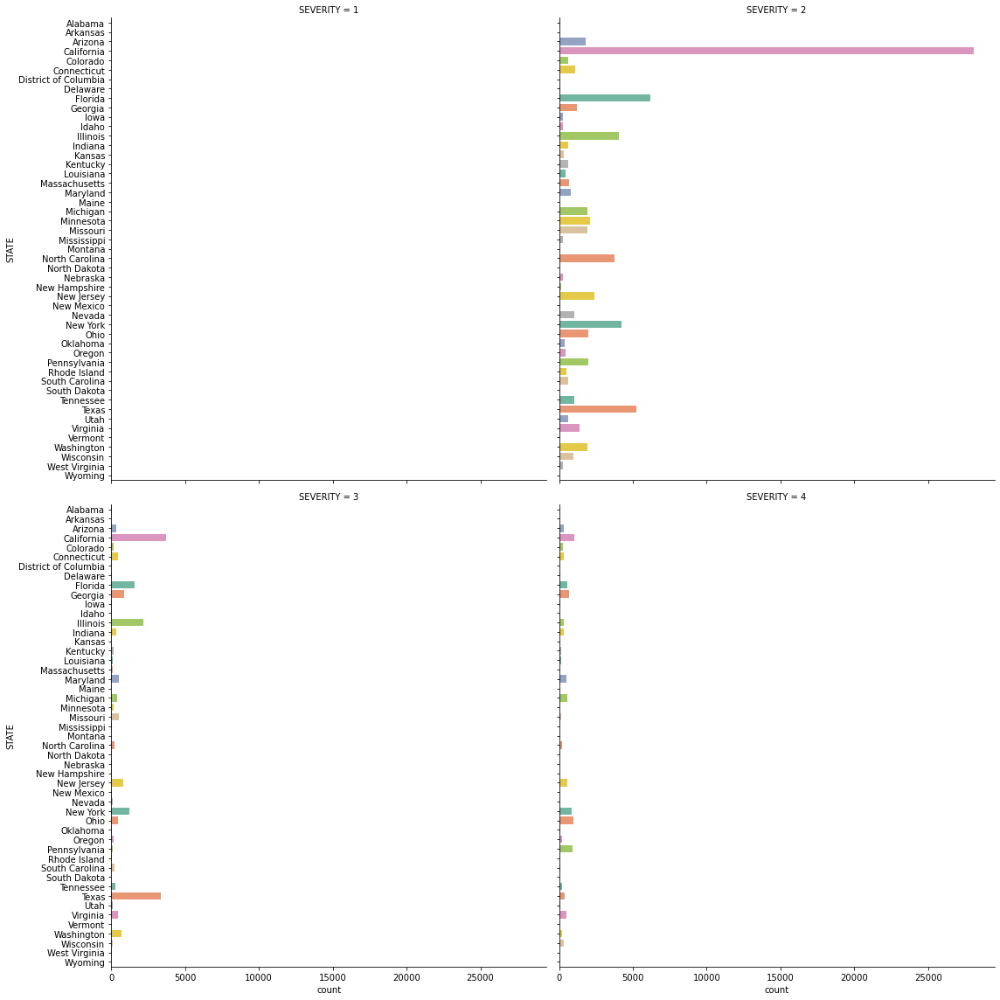

In [126]:
sb.catplot(y = 'STATE', data = us_acd_16cln, col = 'SEVERITY', kind = 'count', col_wrap = 2, height = 8, 
           palette='Set2')

Text(0.5, 1.0, 'State vs Severity')

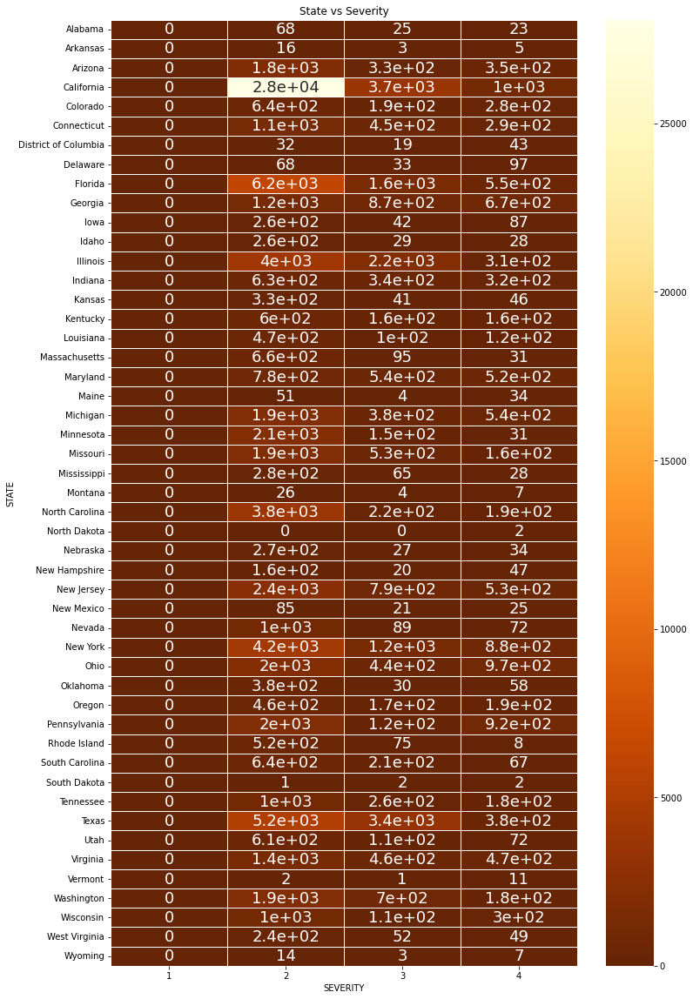

In [127]:
f = plt.figure(figsize=(12, 20))
sb.heatmap(us_acd_16cln.groupby(['STATE', 'SEVERITY']).size().unstack(), 
           linewidths = 1, annot = True, annot_kws = {"size": 18}, cmap = "YlOrBr_r")
plt.title("State vs Severity")

#### Distribution of Weather Condition for Every Level of Severity

Here we show the distribution of weather condition against each form of severity in terms of categorical plot and heatmap.

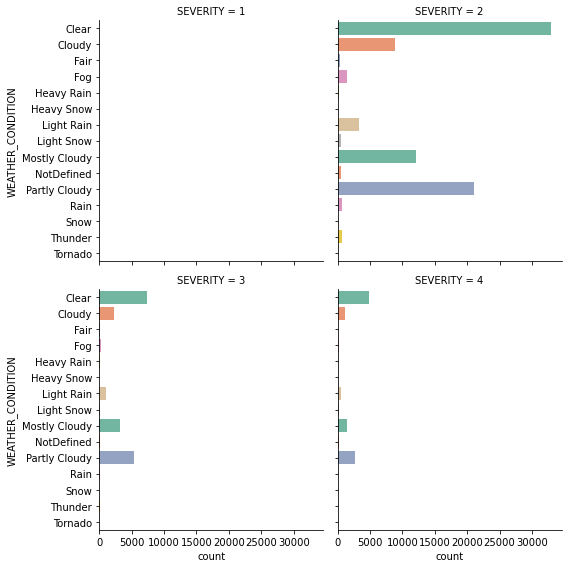

In [128]:
sb.catplot(y = 'WEATHER_CONDITION', data = us_acd_16cln, col = 'SEVERITY', kind = 'count', col_wrap = 2, height = 4, 
           palette='Set2')

Text(0.5, 1.0, 'Weather Condition vs Severity')

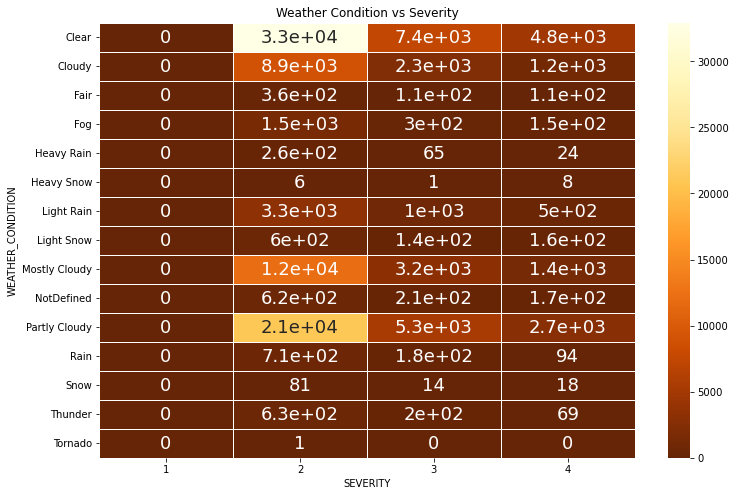

In [129]:
f = plt.figure(figsize=(12, 8))
sb.heatmap(us_acd_16cln.groupby(['WEATHER_CONDITION', 'SEVERITY']).size().unstack(), 
           linewidths = 1, annot = True, annot_kws = {"size": 18}, cmap = "YlOrBr_r")
plt.title("Weather Condition vs Severity")

#### Distribution of Crossing for Every Level of Severity

Here we show the distribution of crossing against each form of severity in terms of categorical plot and heatmap.

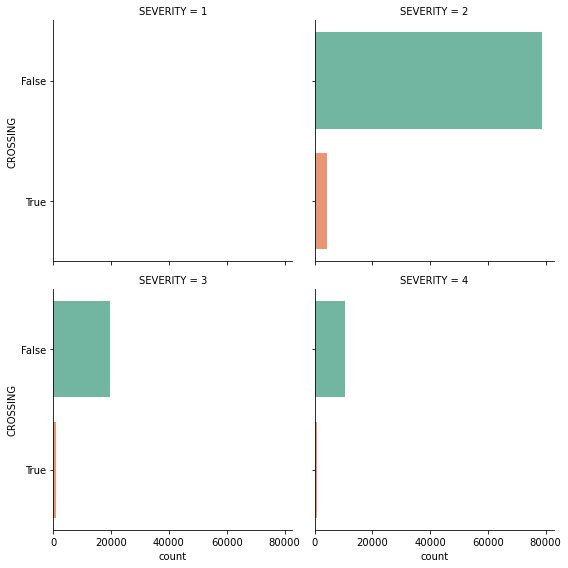

In [130]:
sb.catplot(y = 'CROSSING', data = us_acd_16cln, col = 'SEVERITY', kind = 'count', col_wrap = 2, height = 4, 
           palette='Set2')

Text(0.5, 1.0, 'Crossing vs Severity')

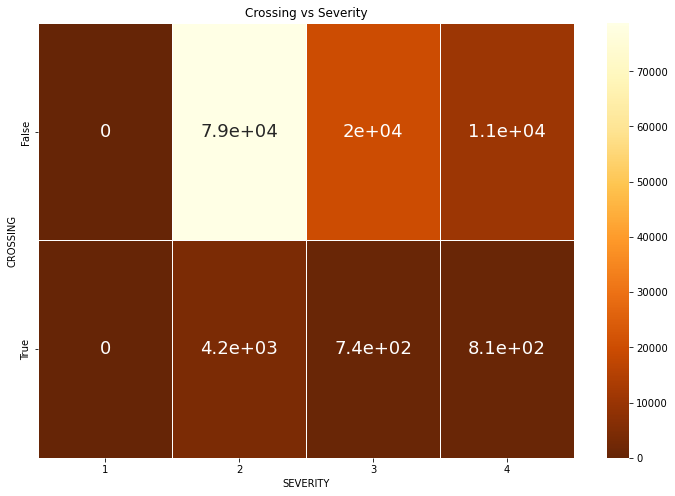

In [131]:
f = plt.figure(figsize=(12, 8))
sb.heatmap(us_acd_16cln.groupby(['CROSSING', 'SEVERITY']).size().unstack(), 
           linewidths = 1, annot = True, annot_kws = {"size": 18}, cmap = "YlOrBr_r")
plt.title("Crossing vs Severity")

#### Distribution of Junction for Every Level of Severity

Here we show the distribution of junction against each form of severity in terms of categorical plot and heatmap.

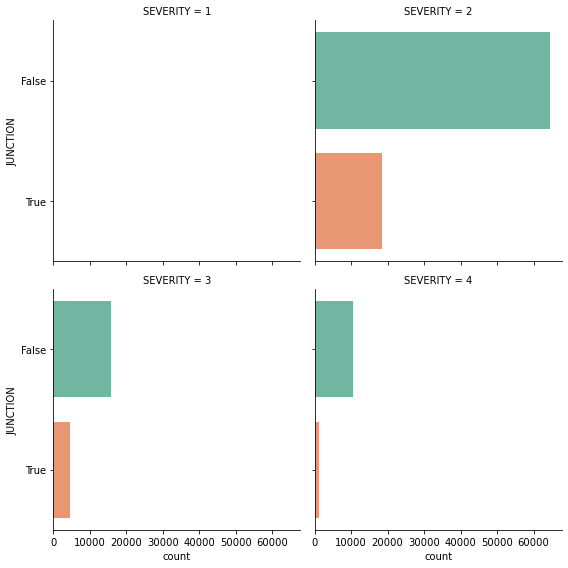

In [132]:
sb.catplot(y = 'JUNCTION', data = us_acd_16cln, col = 'SEVERITY', kind = 'count', col_wrap = 2, height = 4, 
           palette='Set2')

Text(0.5, 1.0, 'Junction vs Severity')

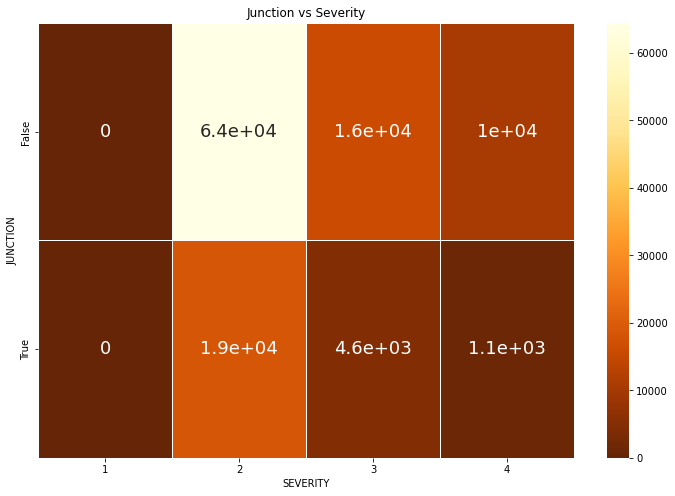

In [133]:
f = plt.figure(figsize=(12, 8))
sb.heatmap(us_acd_16cln.groupby(['JUNCTION', 'SEVERITY']).size().unstack(), 
           linewidths = 1, annot = True, annot_kws = {"size": 18}, cmap = "YlOrBr_r")
plt.title("Junction vs Severity")

#### Distribution of Traffic Signal for Every Level of Severity

Here we show the distribution of traffic signal against each form of severity in terms of categoricalplot and heatmap.

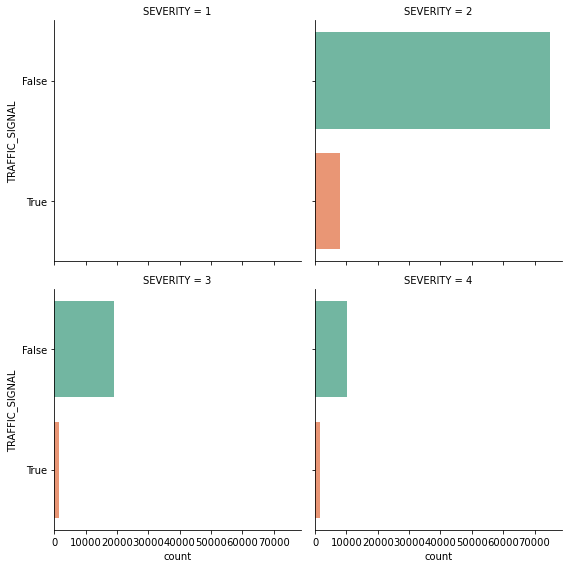

In [134]:
sb.catplot(y = 'TRAFFIC_SIGNAL', data = us_acd_16cln, col = 'SEVERITY', kind = 'count', col_wrap = 2, height = 4, 
           palette='Set2')

Text(0.5, 1.0, 'Traffic Signal vs Severity')

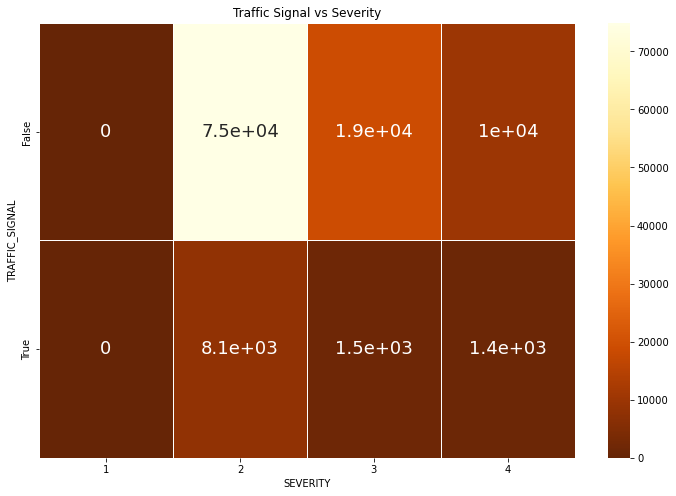

In [135]:
f = plt.figure(figsize=(12, 8))
sb.heatmap(us_acd_16cln.groupby(['TRAFFIC_SIGNAL', 'SEVERITY']).size().unstack(), 
           linewidths = 1, annot = True, annot_kws = {"size": 18}, cmap = "YlOrBr_r")
plt.title("Traffic Signal vs Severity")

#### Distribution of Day Night for Every Level of Severity

Here we show the distribution of day or night against each form of severity in terms of categorical plot and heatmap.

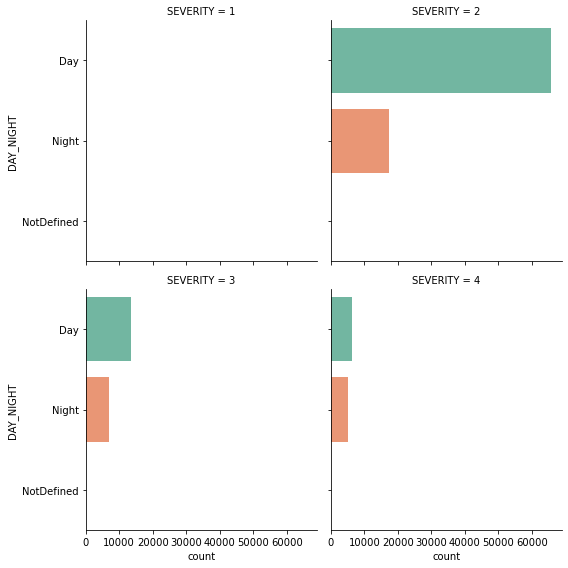

In [136]:
sb.catplot(y = 'DAY_NIGHT', data = us_acd_16cln, col = 'SEVERITY', kind = 'count', col_wrap = 2, height = 4, 
           palette='Set2')

Text(0.5, 1.0, 'Day Night vs Severity')

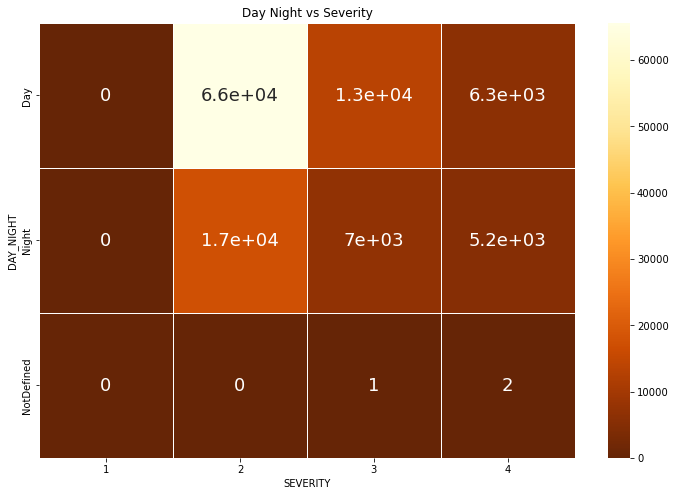

In [137]:
f = plt.figure(figsize=(12, 8))
sb.heatmap(us_acd_16cln.groupby(['DAY_NIGHT', 'SEVERITY']).size().unstack(), 
           linewidths = 1, annot = True, annot_kws = {"size": 18}, cmap = "YlOrBr_r")
plt.title("Day Night vs Severity")

## A little more on data visualization...

### Location (State)

In [138]:
us_acd_16cln["STATE"].value_counts().sort_values(ascending=False)

California              32819
Texas                    9009
Florida                  8369
Illinois                 6518
New York                 6373
North Carolina           4175
New Jersey               3711
Ohio                     3396
Pennsylvania             2999
Michigan                 2863
Washington               2802
Georgia                  2730
Missouri                 2606
Arizona                  2482
Virginia                 2320
Minnesota                2302
Connecticut              1857
Maryland                 1829
Tennessee                1488
Wisconsin                1409
Indiana                  1286
Nevada                   1206
Colorado                 1114
Kentucky                  925
South Carolina            922
Oregon                    822
Utah                      800
Massachusetts             782
Louisiana                 696
Rhode Island              603
Oklahoma                  473
Kansas                    416
Iowa                      389
Mississipp

#### States with Top 10 Highest Accident Occurence

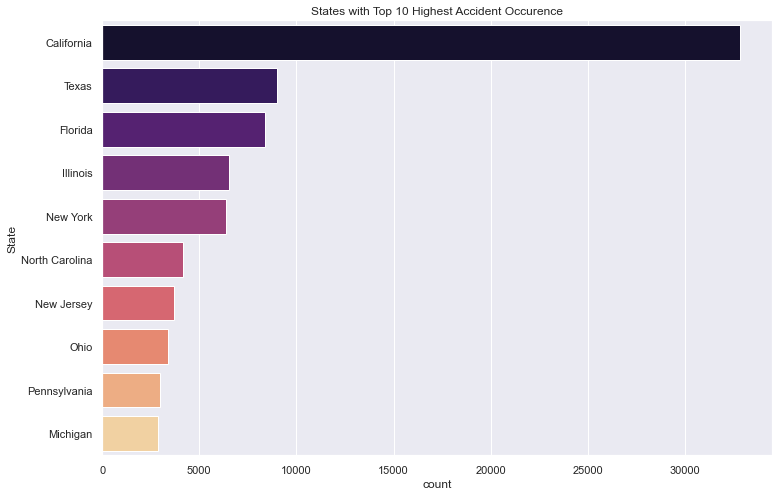

In [139]:
state_obj=us_acd_16cln["STATE"].astype("object")
state_obj_10h=state_obj.value_counts().sort_values(ascending=False)[0:10]
sb.set_style("white")
sb.set(rc={'figure.figsize':(12,8)})
sb.barplot(x=state_obj_10h.values, y=state_obj_10h.index, palette='magma')
plt.xlabel("count")
plt.ylabel("State")
plt.title("States with Top 10 Highest Accident Occurence")
plt.show()

#### States with Top 10 Lowest Accident Occurence

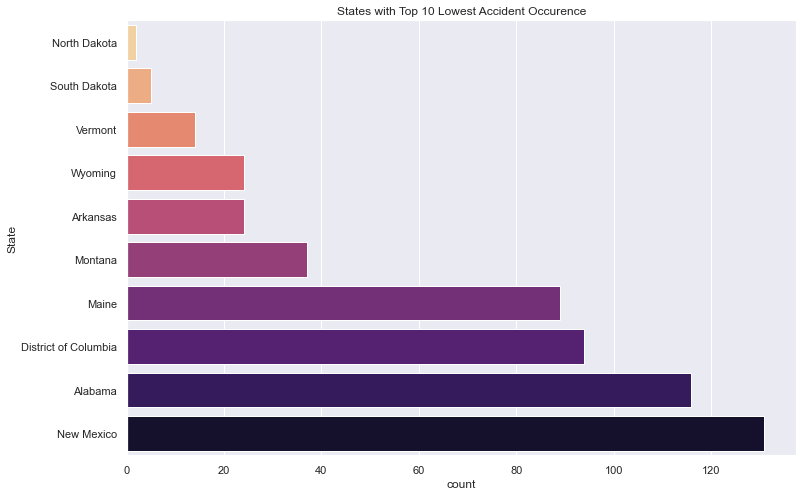

In [140]:
state_obj_10l=state_obj.value_counts().sort_values(ascending=True)[0:10]
sb.set_style("white")
sb.set(rc={'figure.figsize':(12,8)})
sb.barplot(x=state_obj_10l.values, y=state_obj_10l.index, palette='magma_r')
plt.xlabel("count")
plt.ylabel("State")
plt.title("States with Top 10 Lowest Accident Occurence")
plt.show()

#### Most 3 Frequent

In [141]:
most3frequent=us_acd_16cln[(us_acd_16cln["STATE"]=="California") | (us_acd_16cln["STATE"]=="Texas") | 
                           (us_acd_16cln["STATE"]=="Florida")]

In [142]:
most3frequent_cord=most3frequent[["LATITUDE", "LONGITUDE"]].to_numpy()
most3frequent_cord

array([[  38.82584 , -120.02921 ],
       [  37.358208, -121.84002 ],
       [  37.881943, -122.30798 ],
       ...,
       [  34.07221 , -117.90351 ],
       [  33.92441 , -116.90708 ],
       [  33.01369 , -117.26863 ]], dtype=float32)

In [143]:
fig=Figure(width=900, height=600)

us_most=folium.Map(width=900, height=600,
             location=[us_lat, us_lng],
             zoom_start=4, min_zoom=3, max_zoom=12)
fig.add_child(us_most)

plugins.HeatMap(most3frequent_cord, radius=5, blur=3).add_to(us_most)

California_lat=36.7783
California_lng=-119.4179
Texas_lat=31.9686
Texas_lng=-99.9018
Florida_lat=27.6648
Florida_lng=-81.5158

folium.Marker(location=[California_lat, California_lng], 
              popup=[California_lat, California_lng], 
              tooltip="California", 
              icon=folium.Icon(color="blue", icon="info-sign")).add_to(us_most)
folium.Marker(location=[Texas_lat, Texas_lng], 
              popup=[Texas_lat, Texas_lng],
              tooltip="Texas",
              icon=folium.Icon(color="red", icon="info-sign")).add_to(us_most)
folium.Marker(location=[Florida_lat, Florida_lng], 
              popup=[Florida_lat, Florida_lng],
              tooltip="Florida",
              icon=folium.Icon(color="green", icon="info-sign")).add_to(us_most)

us_most

#### Least 3 Frequent

In [144]:
least3frequent=us_acd_16cln[(us_acd_16cln["STATE"]=="Vermont") | (us_acd_16cln["STATE"]=="South Dakota") | 
                           (us_acd_16cln["STATE"]=="North Dakota")]

In [145]:
least3frequent_cord=least3frequent[["LATITUDE", "LONGITUDE"]].to_numpy()
least3frequent_cord

array([[  43.5489  ,  -96.7807  ],
       [  43.60912 ,  -96.94414 ],
       [  44.10343 , -102.71237 ],
       [  46.82896 , -100.87115 ],
       [  46.82766 , -100.88073 ],
       [  43.83625 , -101.65565 ],
       [  43.772373,  -73.05207 ],
       [  43.76187 ,  -73.04976 ],
       [  42.88744 ,  -72.55794 ],
       [  42.85567 ,  -72.58063 ],
       [  42.85567 ,  -72.58063 ],
       [  44.49089 ,  -73.173   ],
       [  44.30859 ,  -73.24577 ],
       [  44.49089 ,  -73.173   ],
       [  44.49101 ,  -73.173004],
       [  43.90055 ,  -73.30819 ],
       [  43.259968,  -72.69001 ],
       [  43.23802 ,  -72.55759 ],
       [  43.24064 ,  -72.56205 ],
       [  43.23802 ,  -72.55759 ],
       [  43.5278  ,  -96.702   ]], dtype=float32)

In [146]:
fig=Figure(width=900, height=600)

us_least=folium.Map(width=900, height=600,
             location=[us_lat, us_lng],
             zoom_start=4, min_zoom=3, max_zoom=12)
fig.add_child(us_least)

plugins.HeatMap(least3frequent_cord, radius=5, blur=3).add_to(us_least)

Vermont_lat=44.5588
Vermont_lng=-72.5778
SouthDakota_lat=43.9695
SouthDakota_lng=-99.9018
NorthDakota_lat=47.5515
NorthDakota_lng=-101.0020

folium.Marker(location=[Vermont_lat, Vermont_lng], 
              popup=[Vermont_lat, Vermont_lng], 
              tooltip="Vermont", 
              icon=folium.Icon(color="blue", icon="info-sign")).add_to(us_least)
folium.Marker(location=[SouthDakota_lat, SouthDakota_lng], 
              popup=[SouthDakota_lat, SouthDakota_lng],
              tooltip="South Dakota",
              icon=folium.Icon(color="red", icon="info-sign")).add_to(us_least)
folium.Marker(location=[NorthDakota_lat, NorthDakota_lng], 
              popup=[NorthDakota_lat, NorthDakota_lng],
              tooltip="North Dakota",
              icon=folium.Icon(color="green", icon="info-sign")).add_to(us_least)

us_least

### Time

#### Month

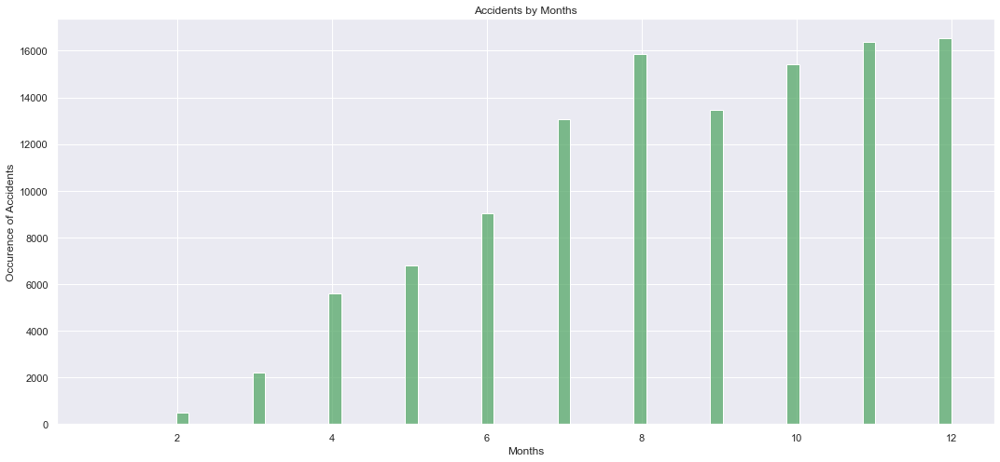

In [147]:
f = plt.figure(figsize=(18, 8))
sb.histplot(data=us_acd_16cln["TIME"].dt.month, color='g')
plt.xlabel('Months')
plt.ylabel('Occurence of Accidents')
plt.title('Accidents by Months')
plt.show()

Why do we see a growing trend in accident occurence?
1. As we can see most accidents occur towards the end of the year. It is most likely that as the locals travel around the United States, this might be a factor that causes a rise in accidents.

2. From the chart above, we can see a spike in accient occurence particularly from June to July. This might be due to the monsoon season towards the end of the year, starting from July. It is common that the monsoon season contributes towards more accidents, especially drivers who are not cautious while driving.

3. Intuitively, we can also say that a growing accident occurence might be due to increase of cars on the road, which therefore increases the probability of one getting accidents.


#### Day of Week

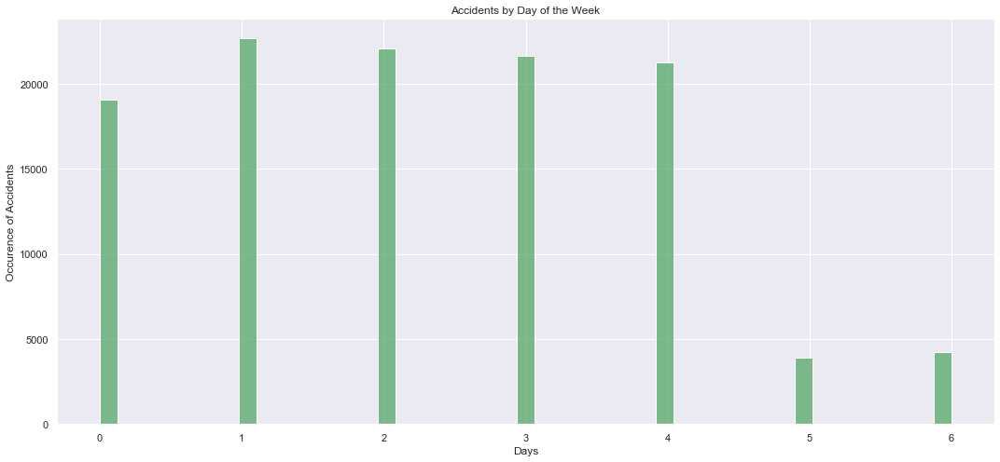

In [148]:
f = plt.figure(figsize=(18, 8))
sb.histplot(data=us_acd_16cln["TIME"].dt.dayofweek, color='g')
plt.xlabel('Days')
plt.ylabel('Occurence of Accidents')
plt.title('Accidents by Day of the Week')
plt.show()

#### Hour

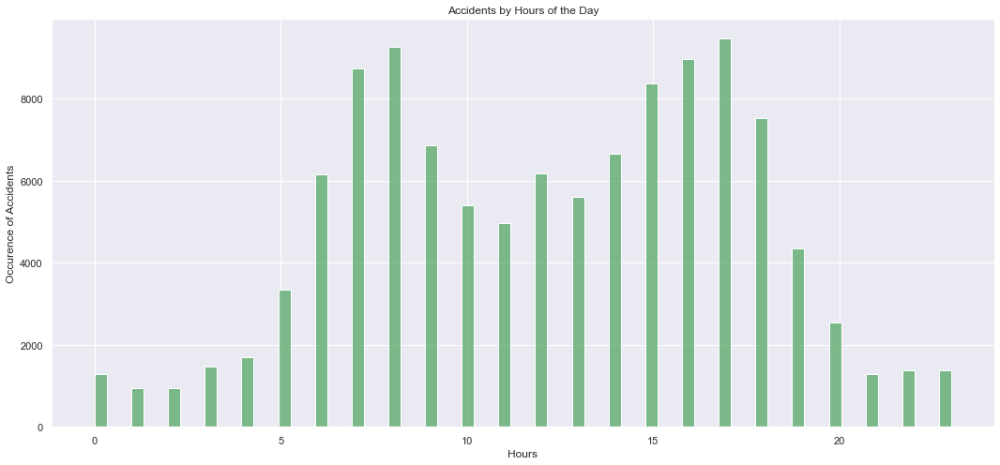

In [149]:
f = plt.figure(figsize=(18, 8))
sb.histplot(data=us_acd_16cln["TIME"].dt.hour, color='g')
plt.xlabel('Hours')
plt.ylabel('Occurence of Accidents')
plt.title('Accidents by Hours of the Day')
plt.show()

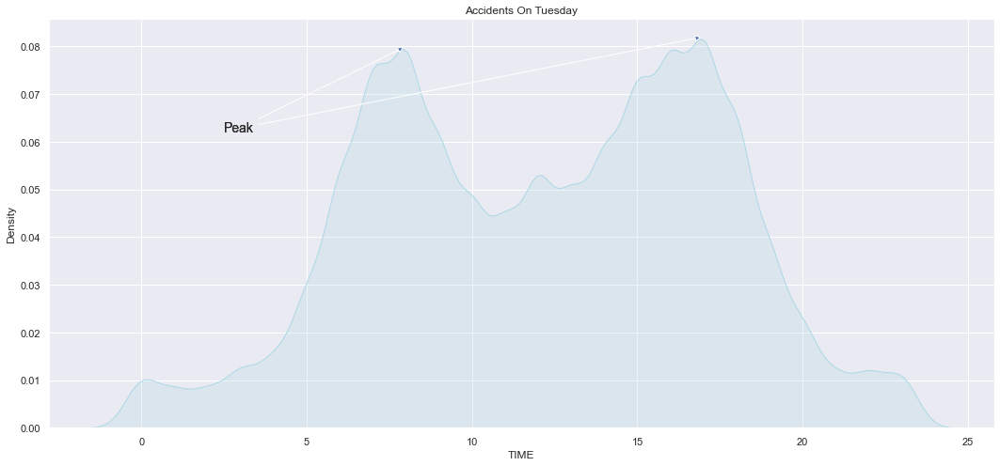

In [150]:
tuesday=us_acd_16cln[us_acd_16cln["TIME"].dt.dayofweek==1]
fig, axes=plt.subplots(figsize=(18,8))
sb.kdeplot(us_acd_16cln["TIME"].dt.hour, fill=True, color='lightblue', data=tuesday)
plt.annotate('Peak',xy=(17,0.082),xytext=(2.5,0.062),arrowprops={'arrowstyle':'-|>'},fontsize= 14)
plt.annotate('Peak',xy=(8,0.08),xytext=(2.5,0.062),arrowprops={'arrowstyle':'-|>'},fontsize= 14)
plt.title('Accidents On Tuesday')
plt.show()

What are the reasons behind accident occurence being the comparatively high at the two peaks and during weekdays?

The two peaks are the time at which people commute to and back from work. Since traffic is most congested during these two peak time, it is therefore highly likely  that accidents will happen, especially when commuters are not driving cautiously.

### Weather Condition

In [151]:
us_acd_16cln["WEATHER_CONDITION"].value_counts().sort_values(ascending=False)

Clear            45123
Partly Cloudy    29118
Mostly Cloudy    16639
Cloudy           12375
Light Rain        4779
Fog               1971
NotDefined         994
Rain               979
Thunder            897
Light Snow         895
Fair               584
Heavy Rain         346
Snow               113
Heavy Snow          15
Tornado              1
Name: WEATHER_CONDITION, dtype: int64

#### Weather Conditions with Top 5 Highest Accident Occurence

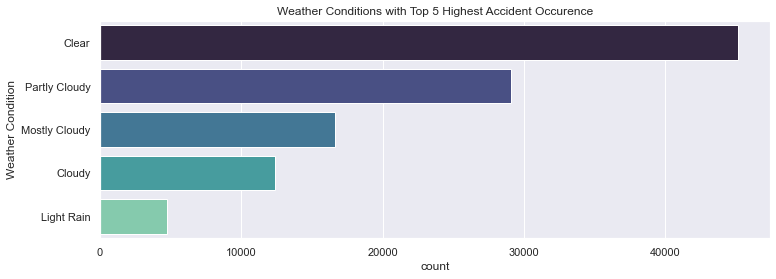

In [152]:
wc_obj=us_acd_16cln["WEATHER_CONDITION"].astype("object")
wc_obj_5h=wc_obj.value_counts().sort_values(ascending=False)[0:5]
sb.set_style("white")
sb.set(rc={'figure.figsize':(12,4)})
sb.barplot(x=wc_obj_5h.values, y=wc_obj_5h.index, palette='mako')
plt.xlabel("count")
plt.ylabel("Weather Condition")
plt.title("Weather Conditions with Top 5 Highest Accident Occurence")
plt.show()

#### Weather Conditions with Top 5 Lowest Accident Occurence

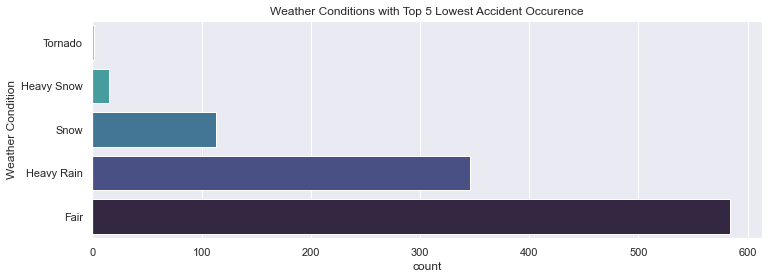

In [153]:
wc_obj=us_acd_16cln["WEATHER_CONDITION"].astype("object")
wc_obj_5l=wc_obj.value_counts().sort_values(ascending=True)[0:5]
sb.set_style("white")
sb.set(rc={'figure.figsize':(12,4)})
sb.barplot(x=wc_obj_5l.values, y=wc_obj_5l.index, palette='mako_r')
plt.xlabel("count")
plt.ylabel("Weather Condition")
plt.title("Weather Conditions with Top 5 Lowest Accident Occurence")
plt.show()

We find out that most accidents occur when the weather is clear or cloudy. This is probably since those are the weather for most of the time.

Export the modified csv file.

In [154]:
us_acd_16cln.to_csv('us_accident_2016_cleaned.csv')